# Tabular Playground Series - June 2021
Practice your ML skills on this approachable dataset!

Question 1: How to find features that divide dataset on classes?

Question 2: What is the best strategy - tuning hyper parametrs or genereate feature.

Add features:

1. Interaction multiply
2. Sum features
3. Count of features values (0, 1, 2 etc)
4. Outliers coint with different trashold factors
5. Outliers by feature - not work
6. Somethig else

Learn how detect 8 class?
1. Try make binary classification to find features that could  detect tis class


In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, KBinsDiscretizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, Isomap, MDS, SpectralEmbedding
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix, f1_score
from sklearn.metrics import roc_auc_score, roc_curve, log_loss

import itertools
from lightgbm import LGBMClassifier

random_state = 42

In [3]:
TARGET_NAME = 'target'

In [4]:
path = '../../../data/kaggle/TPS_JUNE2021/tabular-playground-series-jun-2021/'

In [5]:
train_data = pd.read_csv(path + 'train.csv')
test_data = pd.read_csv(path + 'test.csv')
submission = pd.read_csv(path + 'sample_submission.csv')

In [6]:
train_data[TARGET_NAME] = train_data[TARGET_NAME].str.slice(start=6).astype(int) - 1

In [97]:
def show_difference(data, column, target):
    plt.figure(figsize=(16, 8))
    sns.boxenplot(x=target, y=column, data=data)
    plt.grid()
    plt.show()

## 1. Look at th data

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 77 columns):
 #   Column      Non-Null Count   Dtype
---  ------      --------------   -----
 0   id          200000 non-null  int64
 1   feature_0   200000 non-null  int64
 2   feature_1   200000 non-null  int64
 3   feature_2   200000 non-null  int64
 4   feature_3   200000 non-null  int64
 5   feature_4   200000 non-null  int64
 6   feature_5   200000 non-null  int64
 7   feature_6   200000 non-null  int64
 8   feature_7   200000 non-null  int64
 9   feature_8   200000 non-null  int64
 10  feature_9   200000 non-null  int64
 11  feature_10  200000 non-null  int64
 12  feature_11  200000 non-null  int64
 13  feature_12  200000 non-null  int64
 14  feature_13  200000 non-null  int64
 15  feature_14  200000 non-null  int64
 16  feature_15  200000 non-null  int64
 17  feature_16  200000 non-null  int64
 18  feature_17  200000 non-null  int64
 19  feature_18  200000 non-null  int64
 20  feat

In [109]:
train_data.describe().T.head(40)

,count,mean,std,min,25%,50%,75%,max
id,200000.0,99999.500000,57735.171256,0.0,49999.75,99999.5,149999.25,199999.0
feature_0,200000.0,0.972710,3.941836,0.0,0.00,0.0,1.00,61.0
feature_1,200000.0,1.168365,3.993407,0.0,0.00,0.0,1.00,51.0
feature_2,200000.0,2.219325,6.476570,0.0,0.00,0.0,1.00,64.0
feature_3,200000.0,2.296735,7.551858,0.0,0.00,0.0,1.00,70.0
feature_4,200000.0,0.793530,2.935785,0.0,0.00,0.0,0.00,38.0
feature_5,200000.0,1.431105,5.162746,0.0,0.00,0.0,1.00,76.0
feature_6,200000.0,1.010695,3.949231,0.0,0.00,0.0,0.00,43.0
feature_7,200000.0,0.673090,2.234949,0.0,0.00,0.0,0.00,30.0
feature_8,200000.0,1.943980,3.931330,0.0,0.00,0.0,2.00,38.0


In [110]:
train_data.describe().T.tail(37)

,count,mean,std,min,25%,50%,75%,max
feature_39,200000.0,2.332940,4.523171,0.0,0.0,1.0,3.0,49.0
feature_40,200000.0,1.255005,4.482382,0.0,0.0,0.0,1.0,81.0
feature_41,200000.0,1.159385,5.407836,0.0,0.0,0.0,1.0,73.0
feature_42,200000.0,0.834600,3.496194,0.0,0.0,0.0,1.0,53.0
feature_43,200000.0,4.472965,7.723795,0.0,0.0,2.0,5.0,63.0
feature_44,200000.0,0.890300,2.150593,0.0,0.0,0.0,1.0,27.0
feature_45,200000.0,0.690865,2.188692,0.0,0.0,0.0,1.0,30.0
feature_46,200000.0,2.413920,9.774465,0.0,0.0,0.0,1.0,117.0
feature_47,200000.0,0.969055,5.845938,0.0,0.0,0.0,0.0,97.0
feature_48,200000.0,1.527270,4.375537,0.0,0.0,0.0,1.0,40.0


In [15]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 76 columns):
 #   Column      Non-Null Count   Dtype
---  ------      --------------   -----
 0   id          100000 non-null  int64
 1   feature_0   100000 non-null  int64
 2   feature_1   100000 non-null  int64
 3   feature_2   100000 non-null  int64
 4   feature_3   100000 non-null  int64
 5   feature_4   100000 non-null  int64
 6   feature_5   100000 non-null  int64
 7   feature_6   100000 non-null  int64
 8   feature_7   100000 non-null  int64
 9   feature_8   100000 non-null  int64
 10  feature_9   100000 non-null  int64
 11  feature_10  100000 non-null  int64
 12  feature_11  100000 non-null  int64
 13  feature_12  100000 non-null  int64
 14  feature_13  100000 non-null  int64
 15  feature_14  100000 non-null  int64
 16  feature_15  100000 non-null  int64
 17  feature_16  100000 non-null  int64
 18  feature_17  100000 non-null  int64
 19  feature_18  100000 non-null  int64
 20  featu

In [181]:
test_data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,100000.0,249999.50000,28867.657797,200000.0,224999.75,249999.5,274999.25,299999.0
feature_0,100000.0,0.99051,4.018930,0.0,0.00,0.0,1.00,61.0
feature_1,100000.0,1.16852,4.030234,0.0,0.00,0.0,1.00,51.0
feature_2,100000.0,2.18273,6.402817,0.0,0.00,0.0,1.00,64.0
feature_3,100000.0,2.31624,7.584742,0.0,0.00,0.0,1.00,70.0
...,...,...,...,...,...,...,...,...
feature_70,100000.0,1.20149,4.784381,0.0,0.00,0.0,1.00,67.0
feature_71,100000.0,0.79863,2.427921,0.0,0.00,0.0,1.00,30.0
feature_72,100000.0,1.31336,4.443859,0.0,0.00,0.0,1.00,61.0
feature_73,100000.0,2.93515,10.788330,0.0,0.00,0.0,1.00,127.0


In [17]:
submission.head()

,id,Class_1,Class_2,Class_3,Class_4,Class_5,Class_6,Class_7,Class_8,Class_9
0,200000,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111
1,200001,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111
2,200002,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111
3,200003,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111
4,200004,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111,0.1111


## Features

In [8]:
features = train_data.columns[1:-1]

## Check for duplicates

In [174]:
print(train_data.duplicated(subset=features, keep=False).sum())
print(train_data.iloc[:, 1:].duplicated().sum())
print(test_data.iloc[:, 1:].duplicated().sum())

display(train_data[train_data.iloc[:, 1:-1].duplicated(keep=False)].head(5).T.head(40))
display(train_data[train_data.iloc[:, 1:-1].duplicated(keep=False)].head(5).T.tail(33))

330

## EDA

### 1. Target distirbution

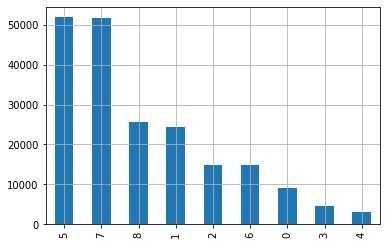

In [32]:
train_data[TARGET_NAME].value_counts().plot(kind='bar')
plt.grid()

### 2. Feature variance

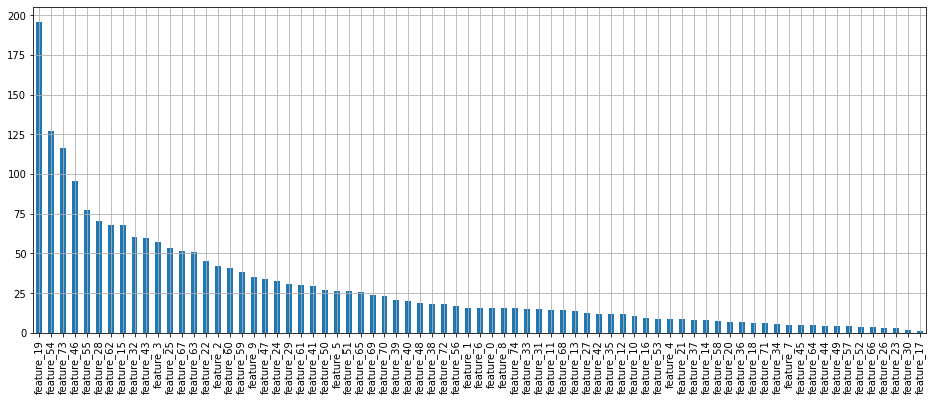

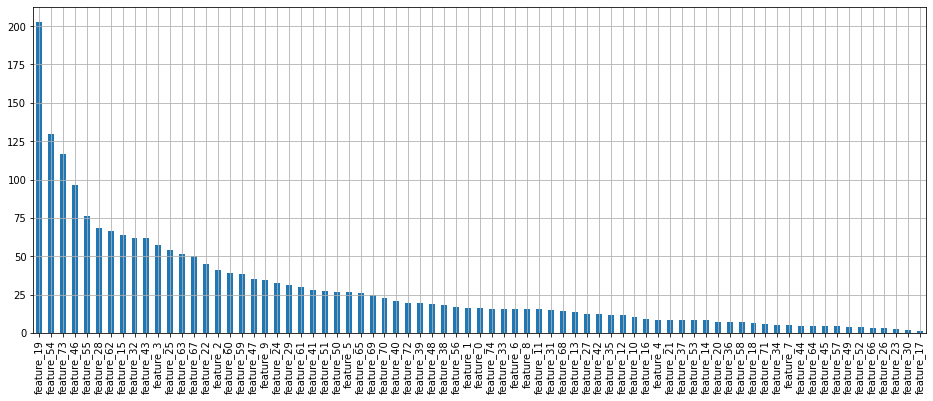

In [33]:
train_data[features].var().sort_values(ascending=False).plot(kind='bar', figsize=(16,6))
plt.grid()
plt.show()
test_data[features].var().sort_values(ascending=False).plot(kind='bar', figsize=(16,6))
plt.grid()
plt.show()

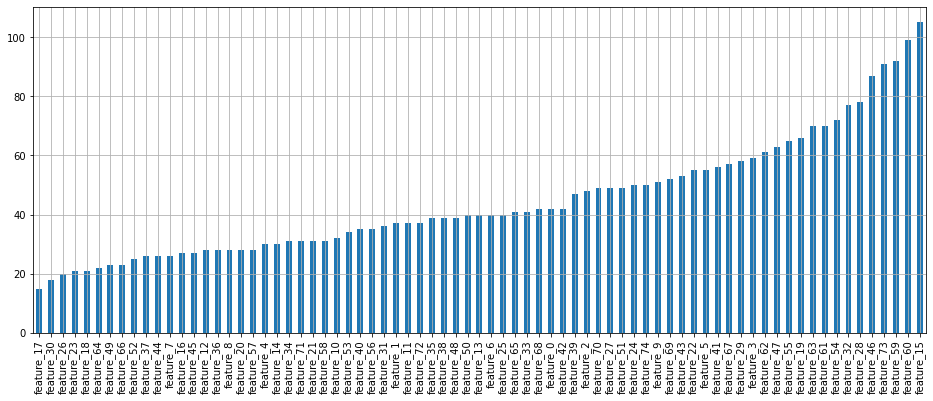

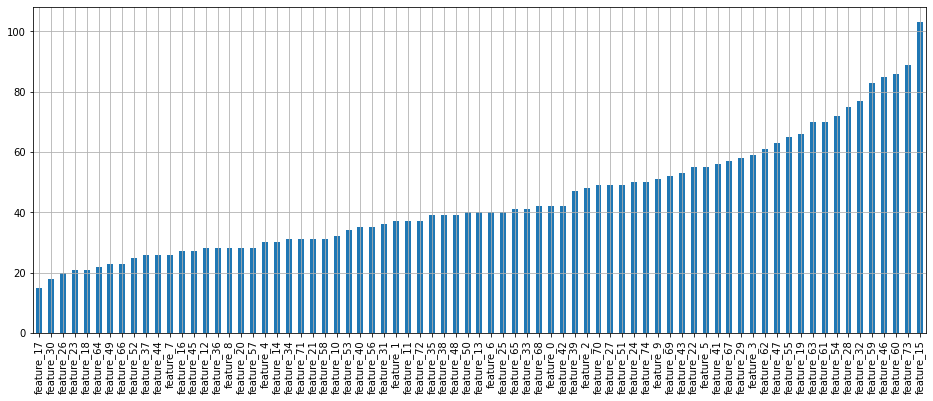

In [21]:
train_data[features].apply('nunique', axis=0).sort_values(ascending=True).plot(kind='bar', figsize=(16,6))
plt.grid()
plt.show()
test_data[features].apply('nunique', axis=0).sort_values(ascending=True).plot(kind='bar', figsize=(16,6))
plt.grid()
plt.show()

In [22]:
train_data[features].apply('nunique', axis=0).sort_values(ascending=True).head()

feature_17    15
feature_30    18
feature_26    20
feature_23    21
feature_18    21
dtype: int64

## Correlation

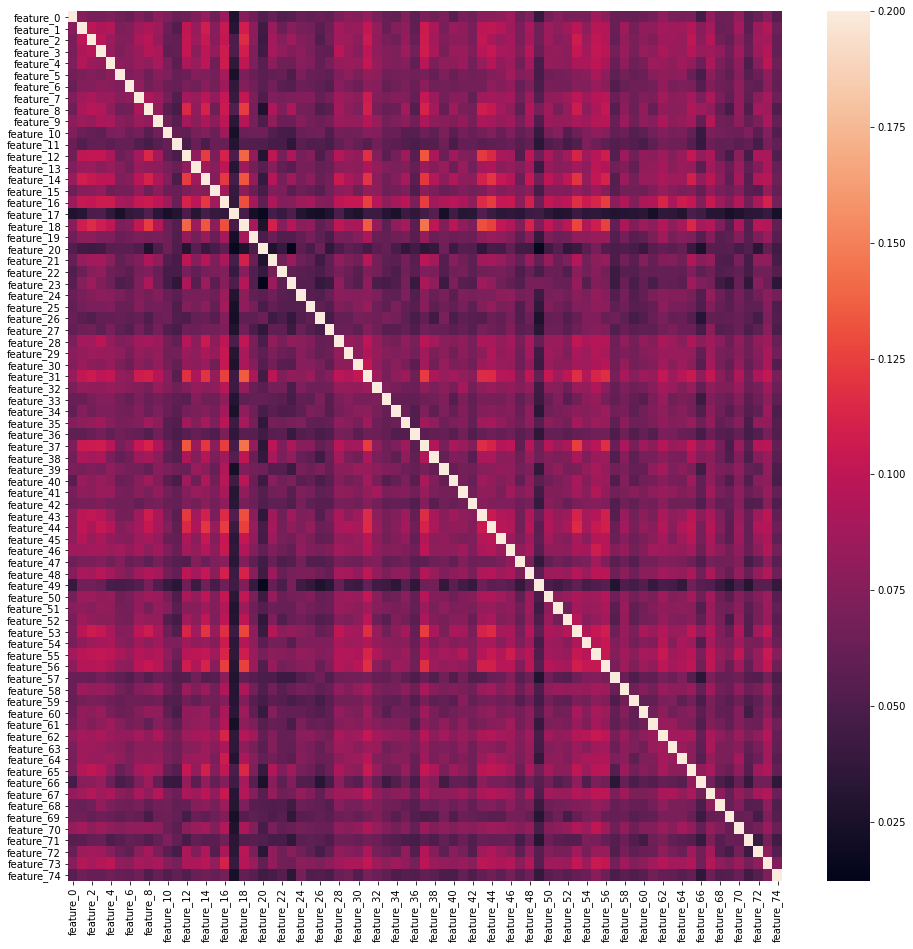

In [288]:
train_corr = train_data[features].corr()
plt.figure(figsize=(16,16))
sns.heatmap(train_corr, vmax=0.2)
plt.show()

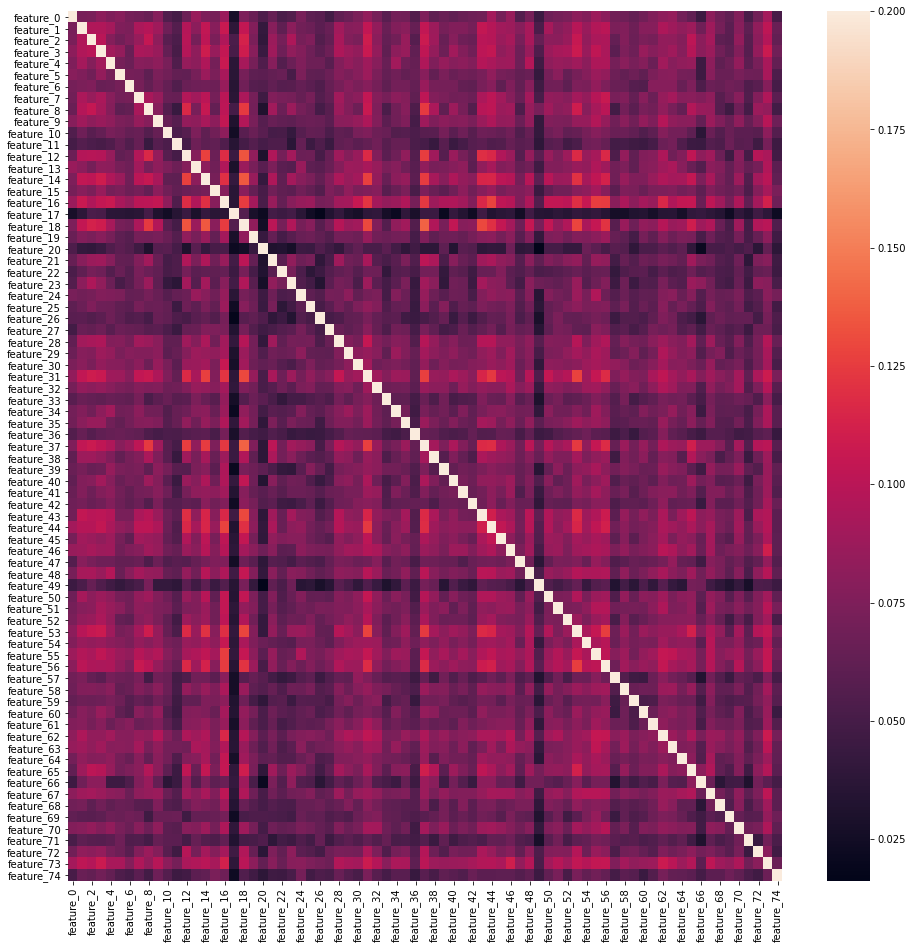

In [287]:
test_corr = test_data[features].corr()
plt.figure(figsize=(16,16))
sns.heatmap(test_corr, vmax=0.2)
plt.show()

## Outliers

In [127]:

for factor in range(2, 5):
    upper_limit = train_data[features].mean() + train_data[features].std() * factor
    lower_limit = train_data[features].mean() - train_data[features].std() * factor

    train_data[f'outliers_count_{factor}'] = (train_data[features] > upper_limit).sum(axis=1)

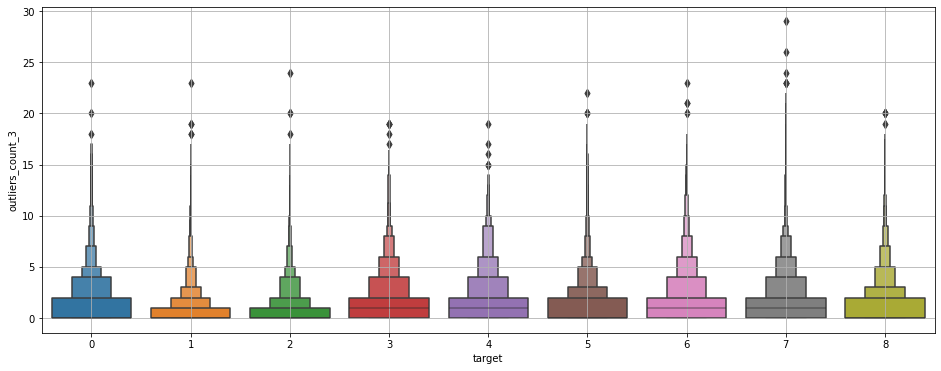

In [128]:
plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='outliers_count_3', data=train_data)
plt.grid()
plt.show()

In [150]:
factor = 4
upper_limit = train_data[features].mean() + train_data[features].std() * factor
outliers = (train_data[features] > upper_limit)
outliers[TARGET_NAME] = train_data[TARGET_NAME]

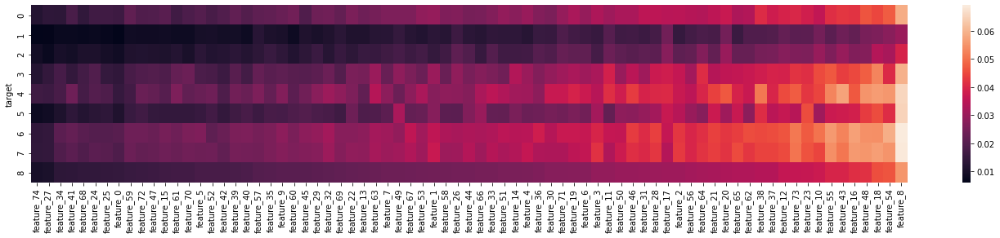

In [147]:
plt.figure(figsize=(24,4))
sns.heatmap(outliers.groupby(TARGET_NAME).mean().sort_values(8, axis=1))
plt.show()

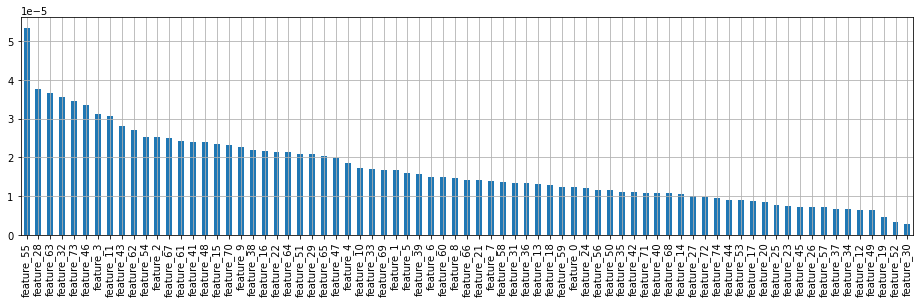

In [151]:
outliers.groupby(TARGET_NAME).mean().var().sort_values(ascending=False).plot(kind='bar', figsize=(16,4))
plt.grid()
plt.show()

In [142]:
features

Index(['feature_0', 'feature_1', 'feature_2', 'feature_3', 'feature_4',
       'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9',
       'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14',
       'feature_15', 'feature_16', 'feature_17', 'feature_18', 'feature_19',
       'feature_20', 'feature_21', 'feature_22', 'feature_23', 'feature_24',
       'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_29',
       'feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34',
       'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39',
       'feature_40', 'feature_41', 'feature_42', 'feature_43', 'feature_44',
       'feature_45', 'feature_46', 'feature_47', 'feature_48', 'feature_49',
       'feature_50', 'feature_51', 'feature_52', 'feature_53', 'feature_54',
       'feature_55', 'feature_56', 'feature_57', 'feature_58', 'feature_59',
       'feature_60', 'feature_61', 'feature_62', 'feature_63', 'feature_64',
       'f

In [152]:
f_t_dict = {'feature_55':3, 'feature_28':4, 'feature_73':3, 'feature_8':2}

for feat in  f_t_dict.keys():
    factor = f_t_dict[feat]
    upper_limit = train_data[feat].mean() + train_data[feat].std() * factor
    train_data[f'out_{feat}_{factor}'] = (train_data[feat] > upper_limit).astype(int)

In [153]:
train_data.columns

Index(['id', 'feature_0', 'feature_1', 'feature_2', 'feature_3', 'feature_4',
       'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9',
       'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14',
       'feature_15', 'feature_16', 'feature_17', 'feature_18', 'feature_19',
       'feature_20', 'feature_21', 'feature_22', 'feature_23', 'feature_24',
       'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_29',
       'feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34',
       'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39',
       'feature_40', 'feature_41', 'feature_42', 'feature_43', 'feature_44',
       'feature_45', 'feature_46', 'feature_47', 'feature_48', 'feature_49',
       'feature_50', 'feature_51', 'feature_52', 'feature_53', 'feature_54',
       'feature_55', 'feature_56', 'feature_57', 'feature_58', 'feature_59',
       'feature_60', 'feature_61', 'feature_62', 'feature_63', 'feature_64',
   

## Feature values freq

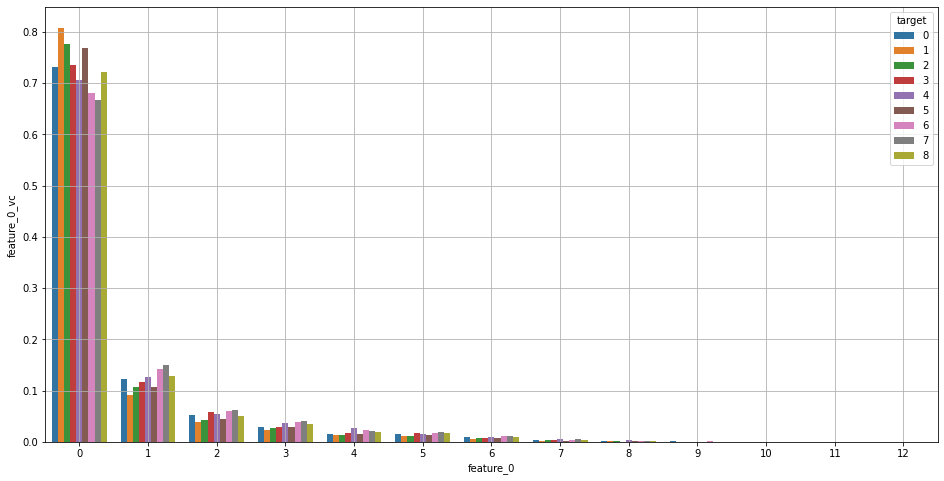

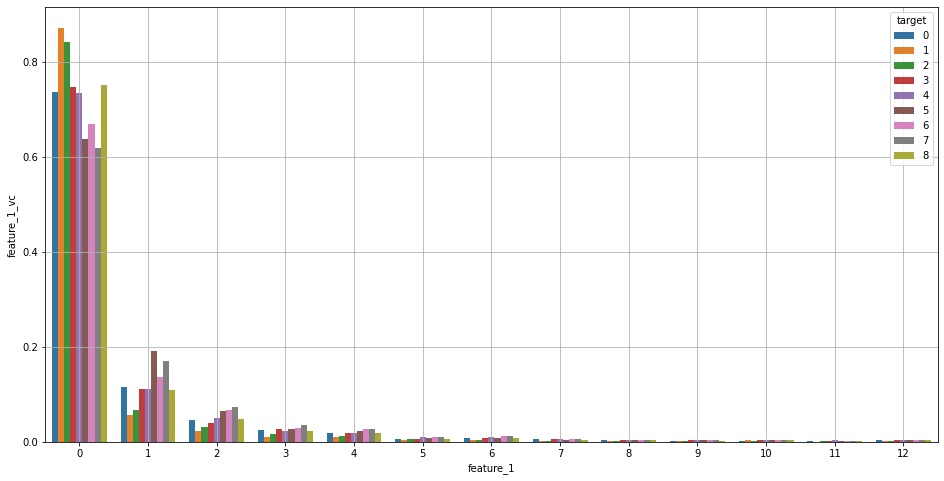

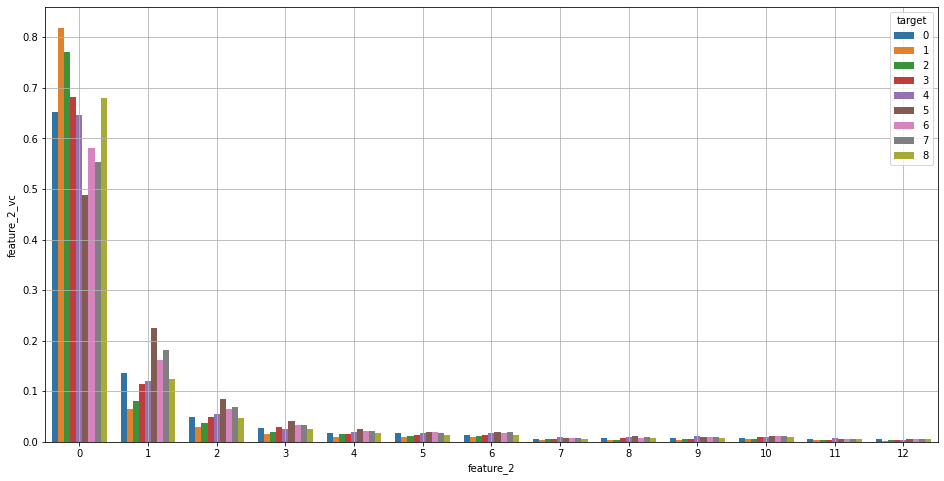

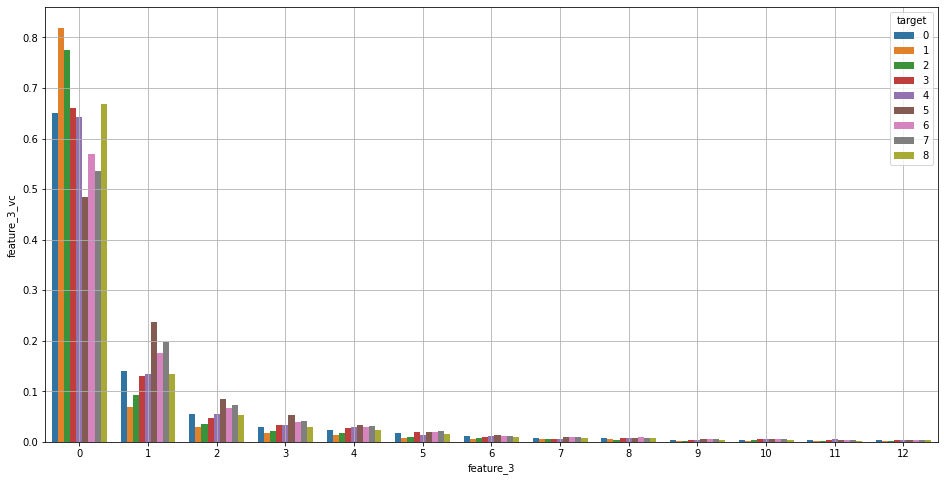

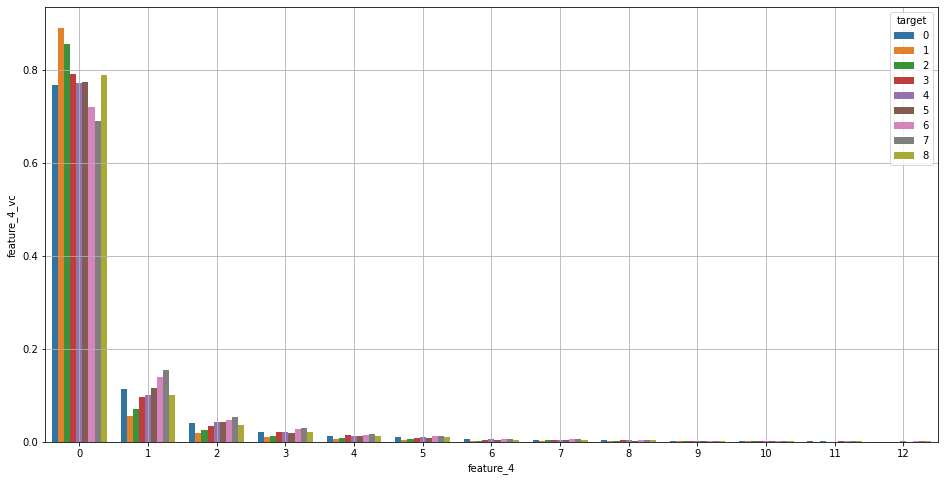

...

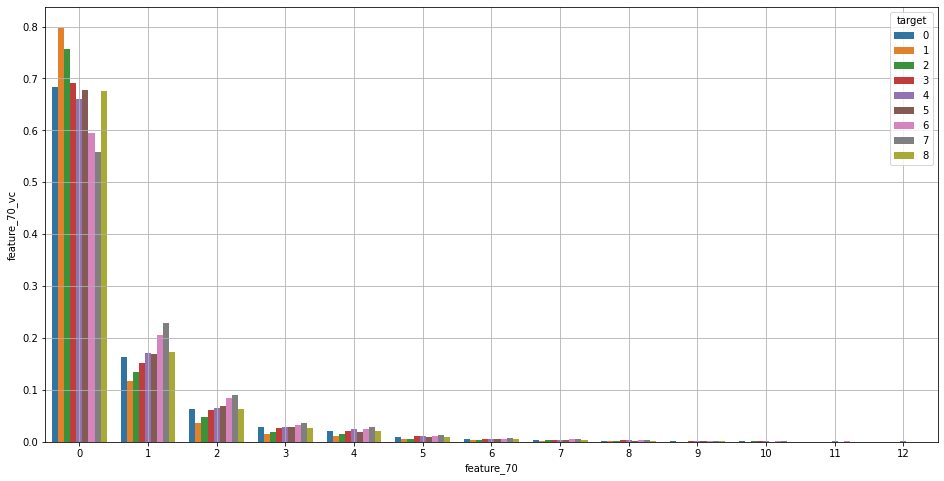

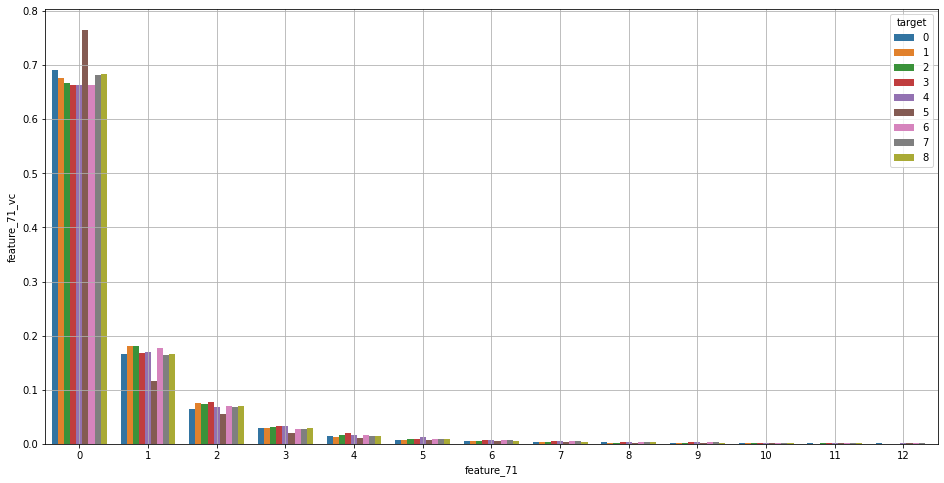

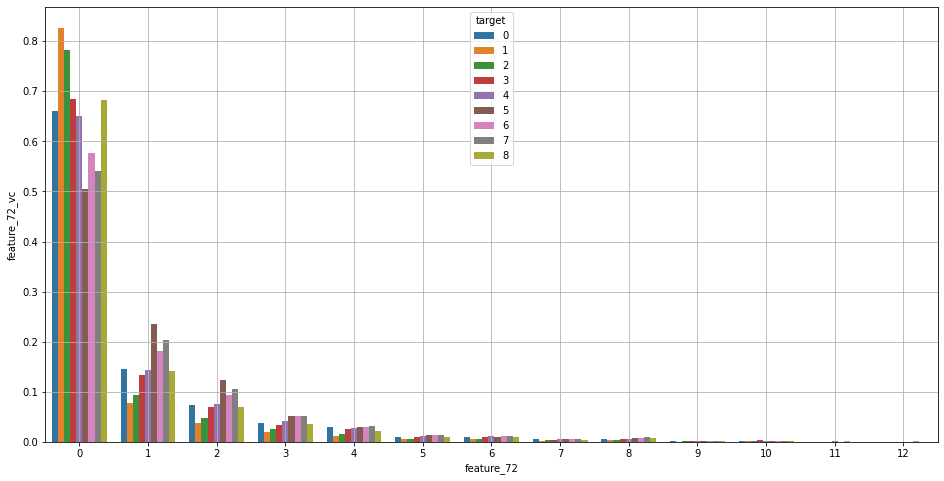

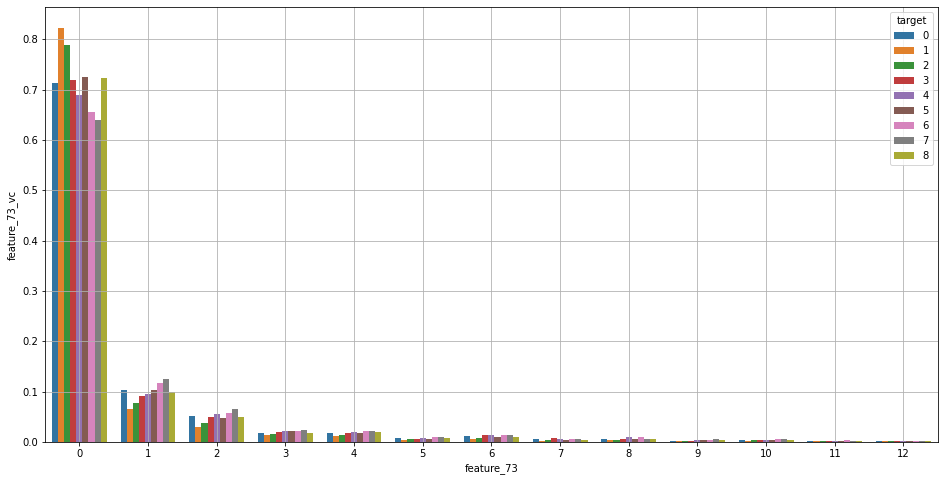

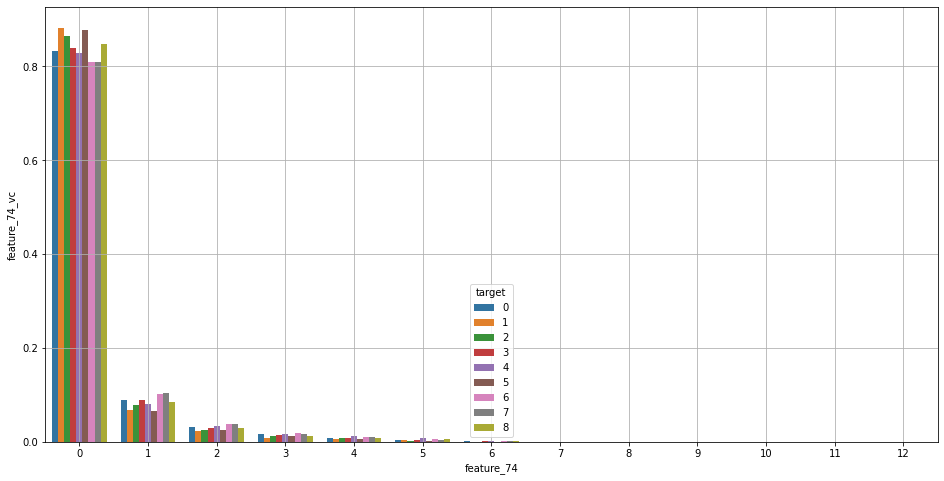

In [292]:
for f in features:
    temp = train_data.groupby(TARGET_NAME)[f]\
              .value_counts(normalize=True)\
              .to_frame()\
               .rename(columns={f:f + '_vc'}).reset_index()
    temp = temp[temp[f] <= 12]
    plt.figure(figsize=(16,8))
    sns.barplot(x=f, y=f + '_vc', hue=TARGET_NAME, data=temp)
    plt.grid()
    plt.show()

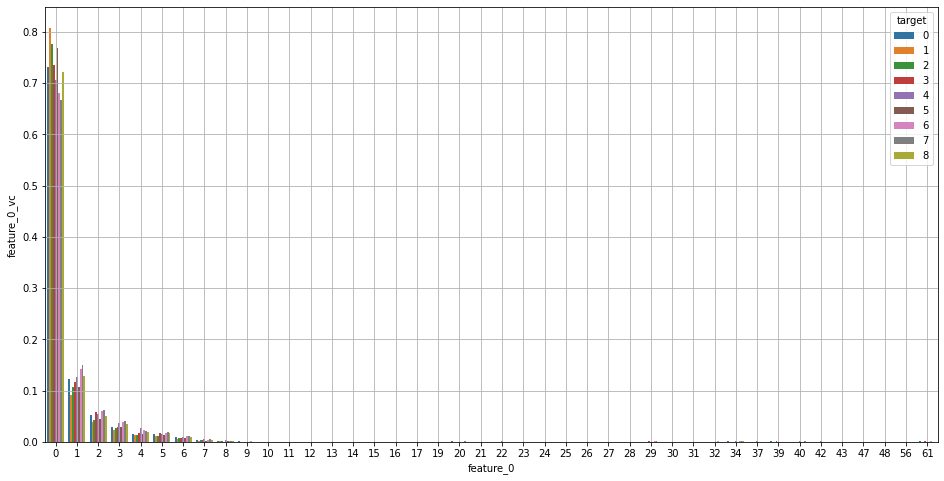

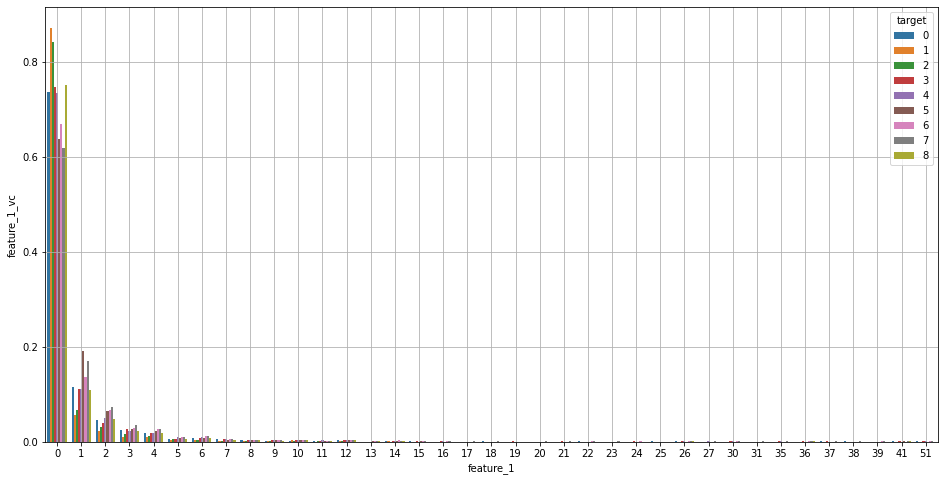

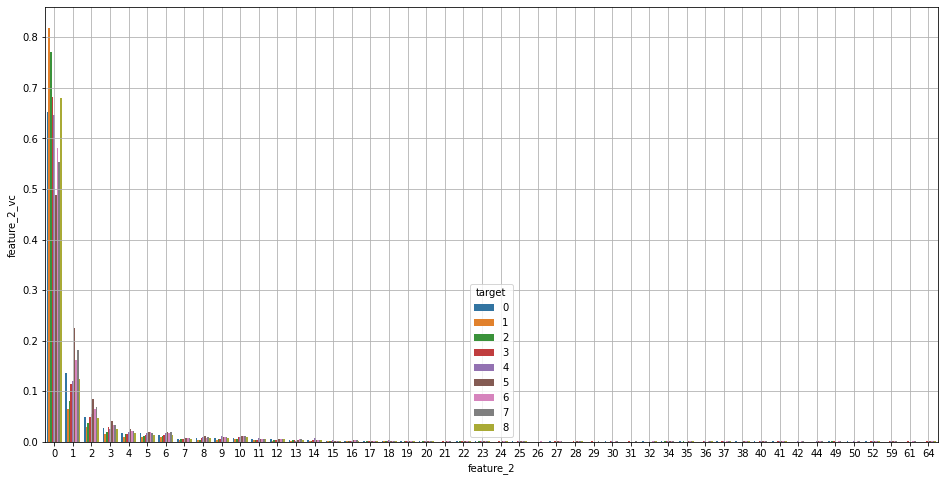

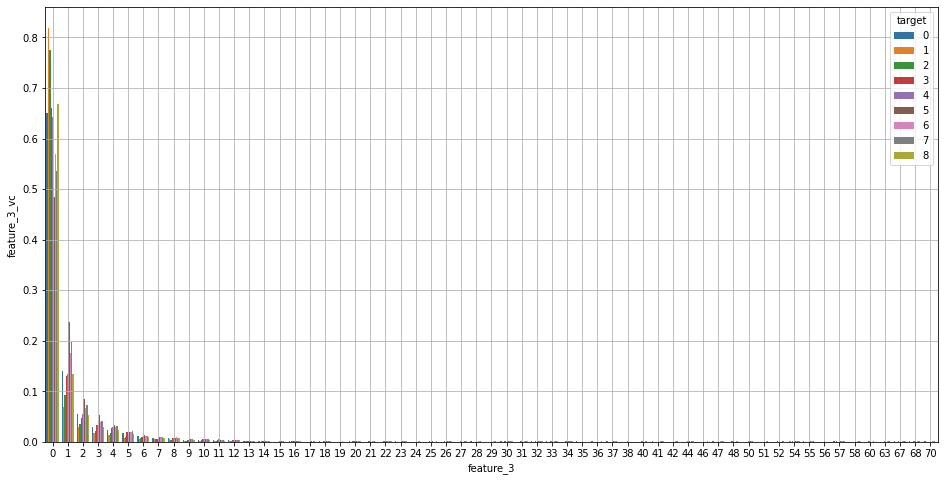

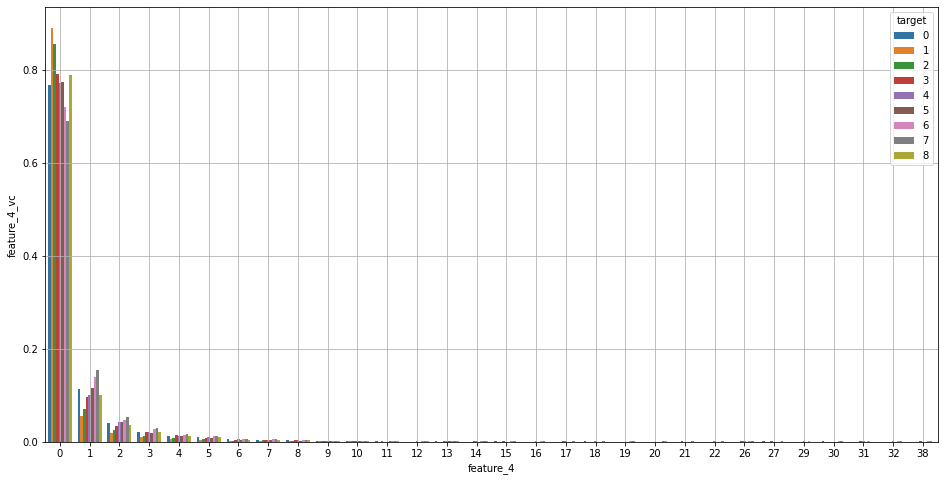

...

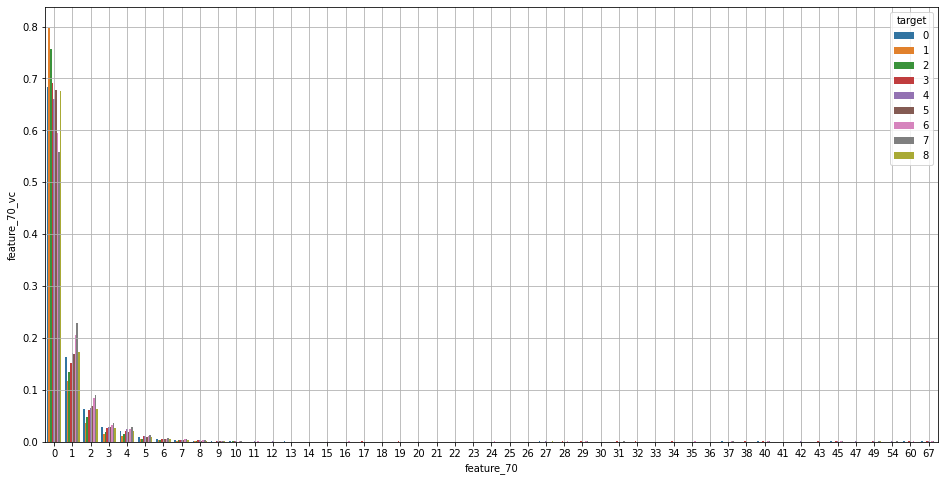

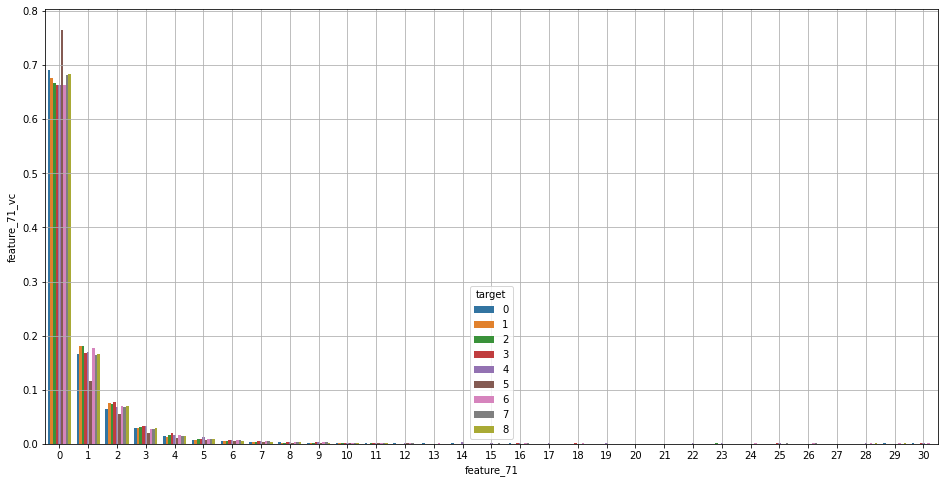

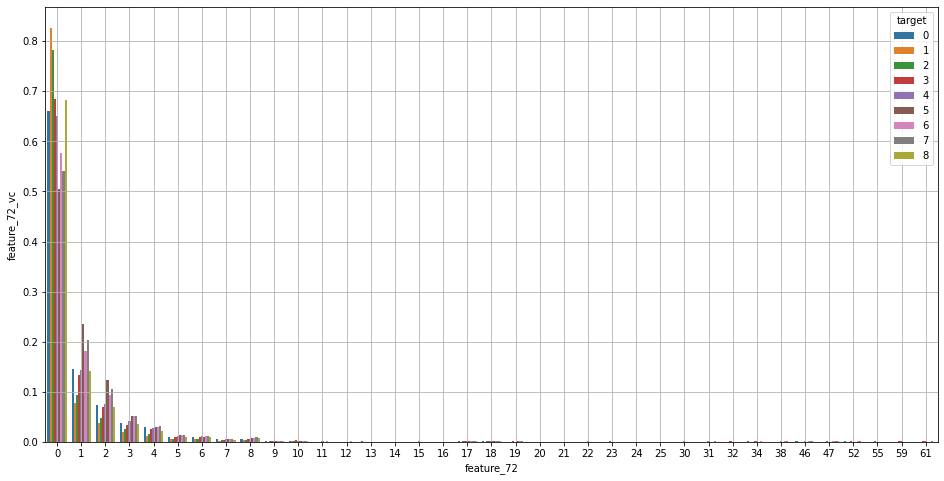

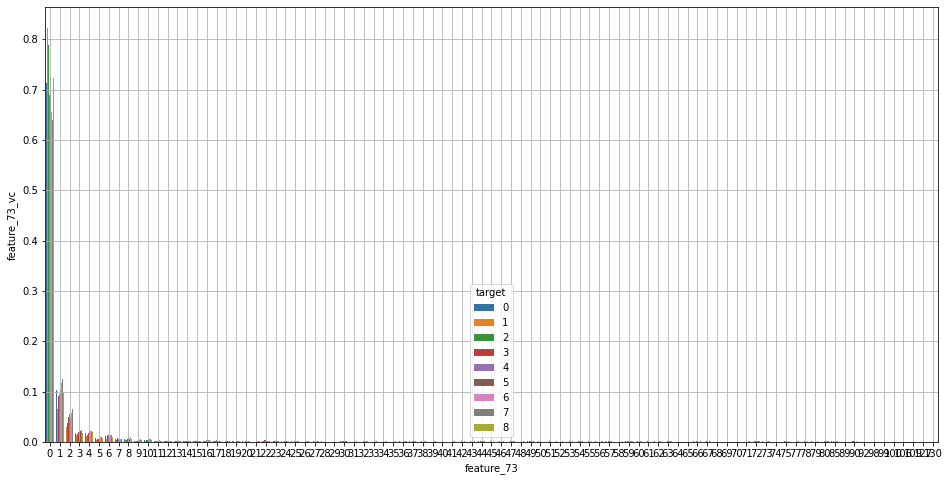

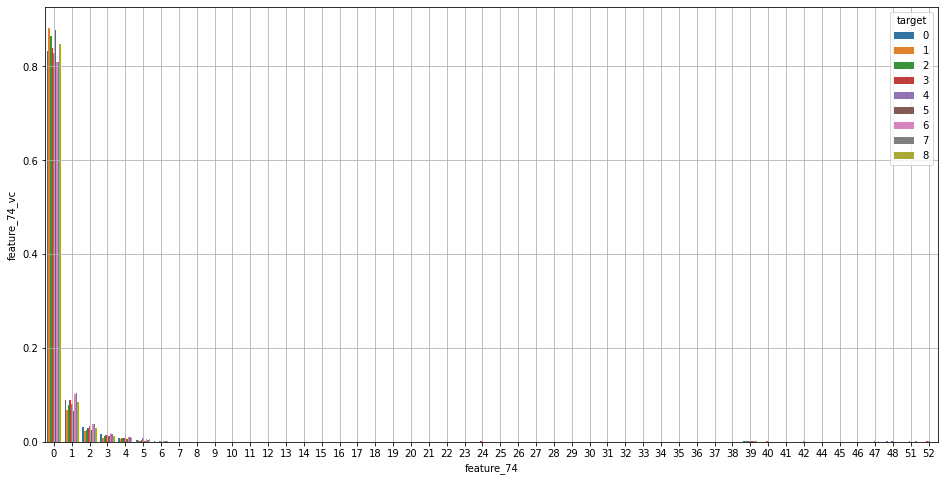

In [282]:
for f in features:
    temp = train_data.groupby(TARGET_NAME)[f]\
              .value_counts(normalize=True)\
              .to_frame()\
               .rename(columns={f:f + '_vc'}).reset_index()
    plt.figure(figsize=(16,8))
    sns.barplot(x=f, y=f + '_vc', hue=TARGET_NAME, data=temp)
    plt.grid()
    plt.show()

## Add some complex features (sum and  counts ov value)

In [422]:
%%time
for i in range(4):
    train_data[f'{i}_counts'] = train_data[features].apply(lambda row: (row == i).sum(), axis=1)
    
train_data['fe_sum'] = train_data[features].apply(lambda row: row.sum(), axis=1)    

CPU times: user 2min 36s, sys: 293 ms, total: 2min 37s
Wall time: 2min 37s


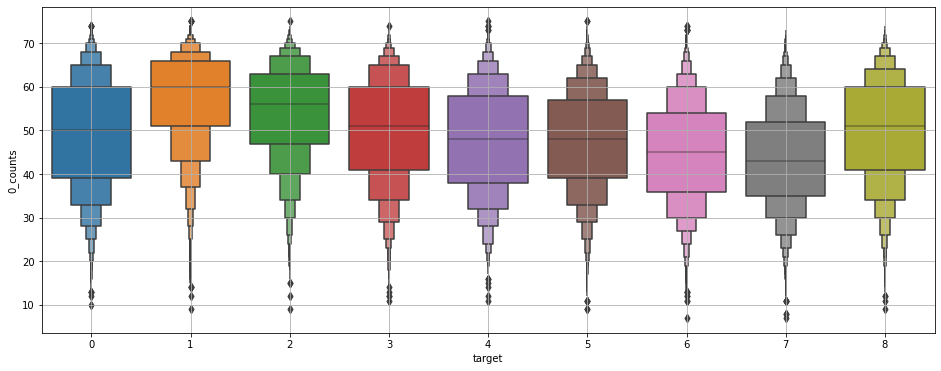

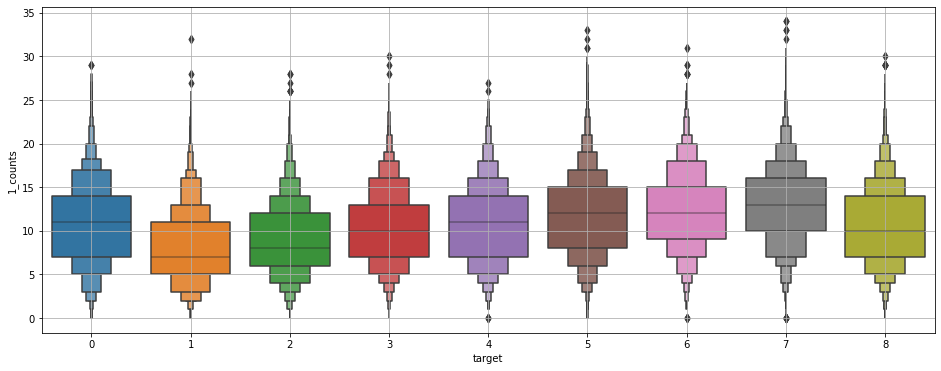

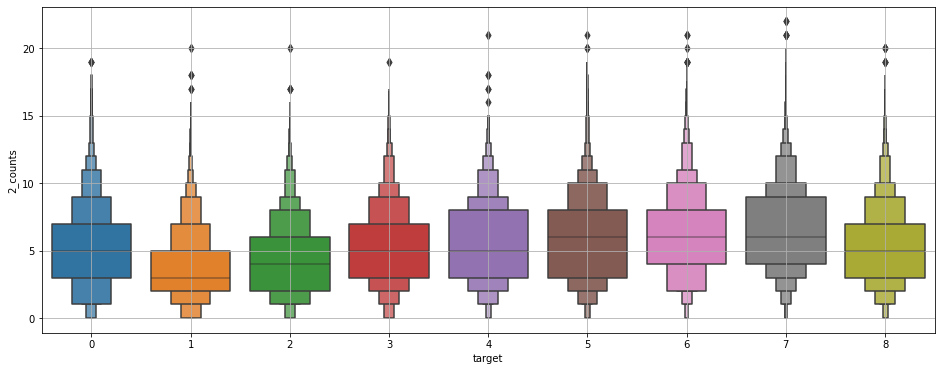

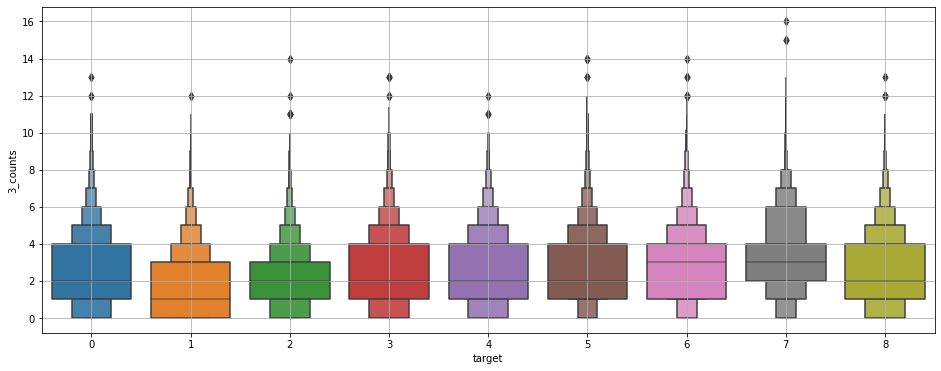

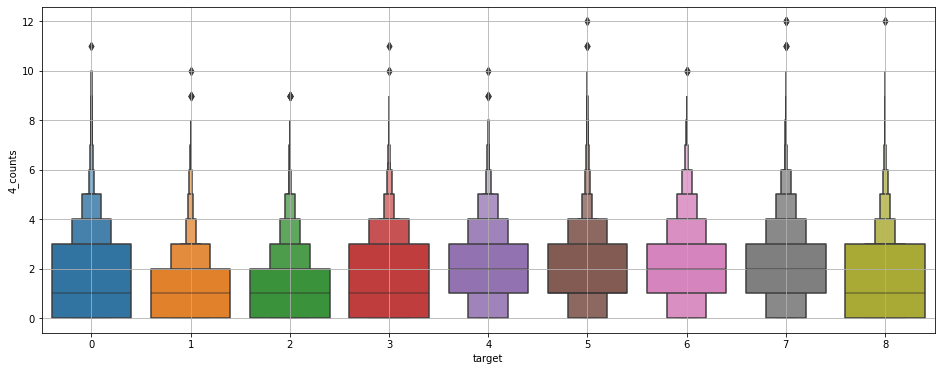

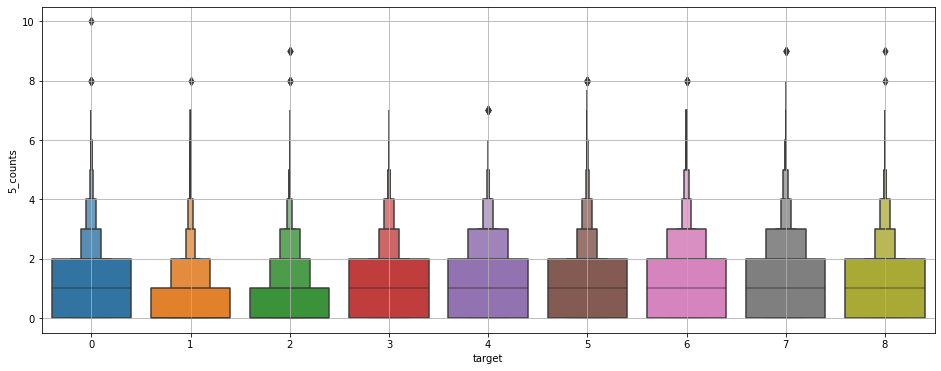

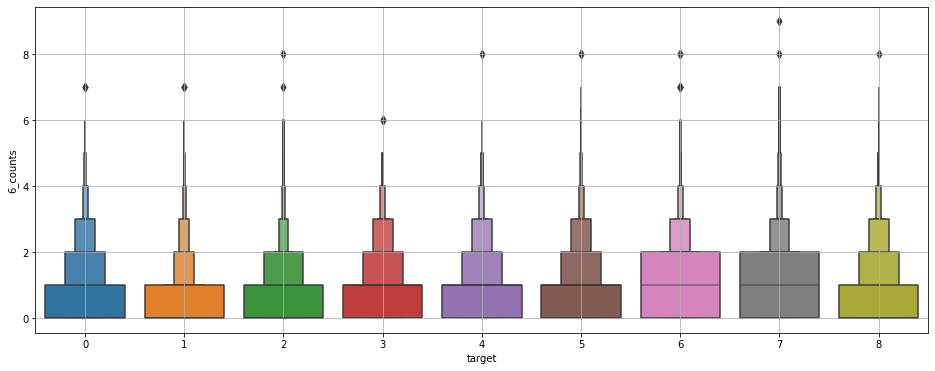

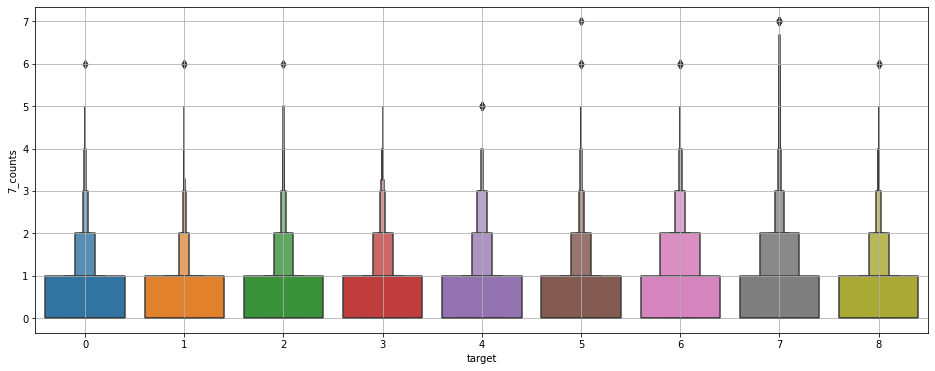

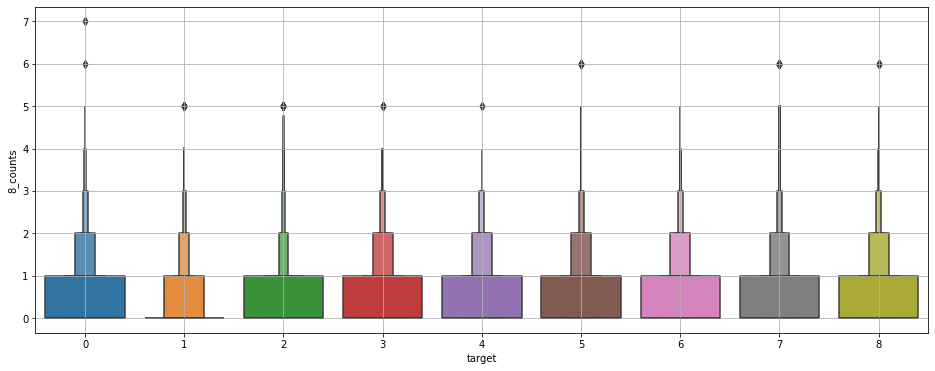

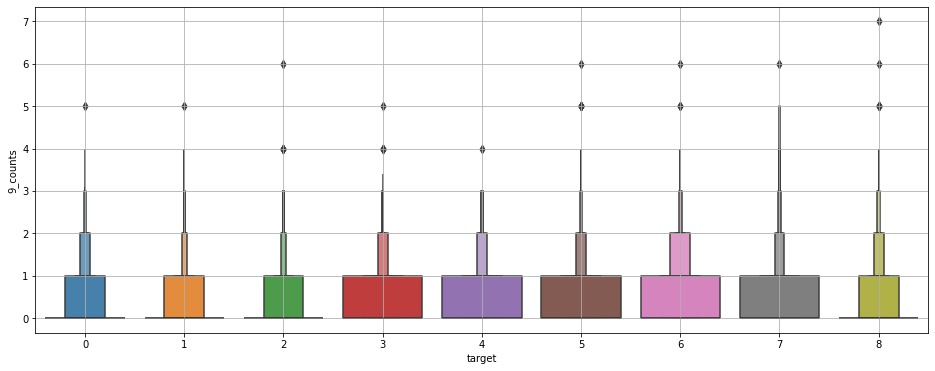

In [301]:
for i in range(4):
    plt.figure(figsize=(16,6))
    sns.boxenplot(x=TARGET_NAME, y=f'{i}_counts', data=train_data)
    plt.grid()
    plt.show()

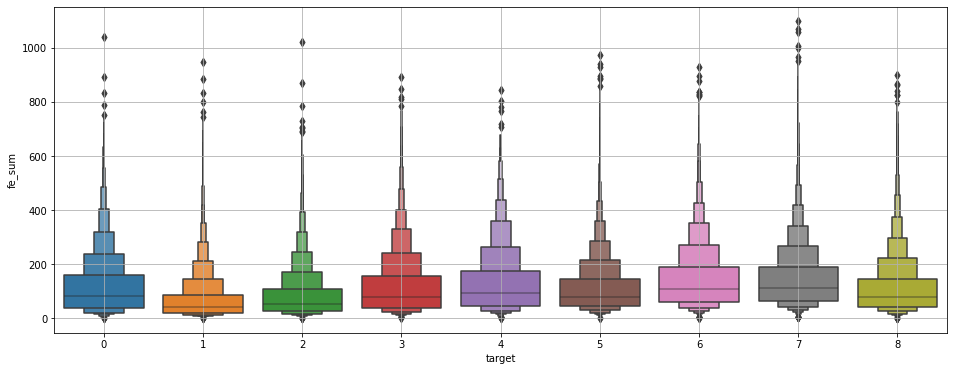

In [303]:
plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='fe_sum', data=train_data)
plt.grid()
plt.show()

In [423]:
%%time
for stat in ['mean', 'std']:
    train_data[f'fe_{stat}'] = train_data[features].apply(lambda row: row.apply(stat), axis=1)
    
    
for stat in ['max', 'median']:
    train_data[f'fe_{stat}_without_0'] = train_data[features].apply(lambda row: row[row!=0].apply(stat), axis=1)
    train_data[f'fe_{stat}_without_0']  = train_data[f'fe_{stat}_without_0'].explode().fillna(0)
    
    
max_var_feat = [f'feature_{f}' for f in [19, 54, 73]]
train_data['max_var_fe_sum'] = train_data[max_var_feat].apply(lambda row: row.sum(), axis=1)         

CPU times: user 16.1 s, sys: 46.1 ms, total: 16.2 s
Wall time: 16.1 s


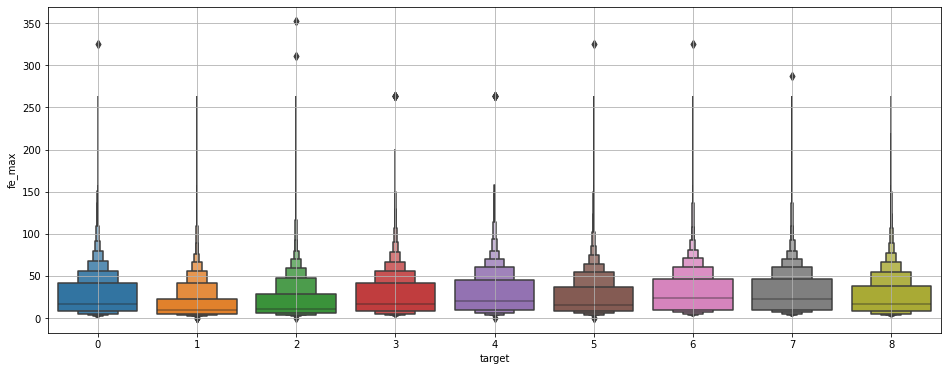

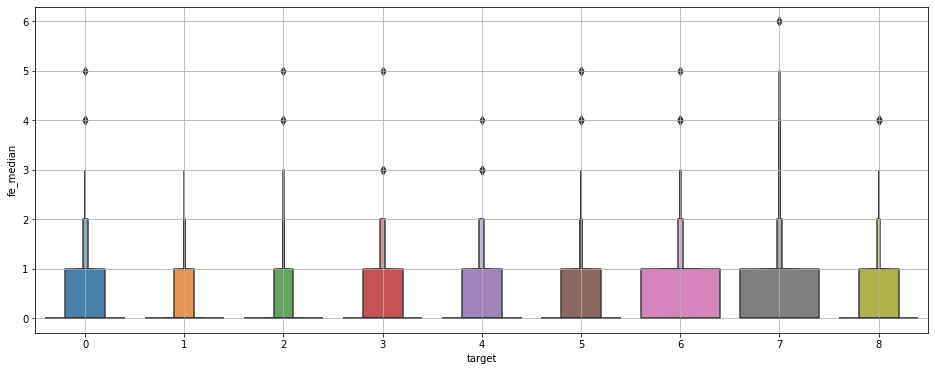

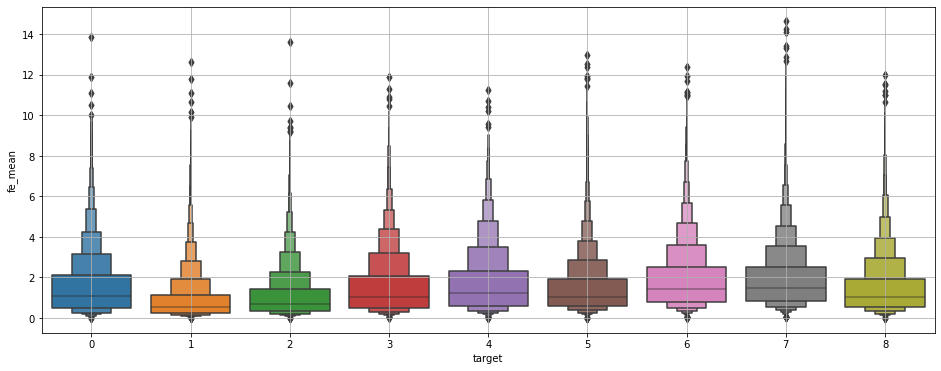

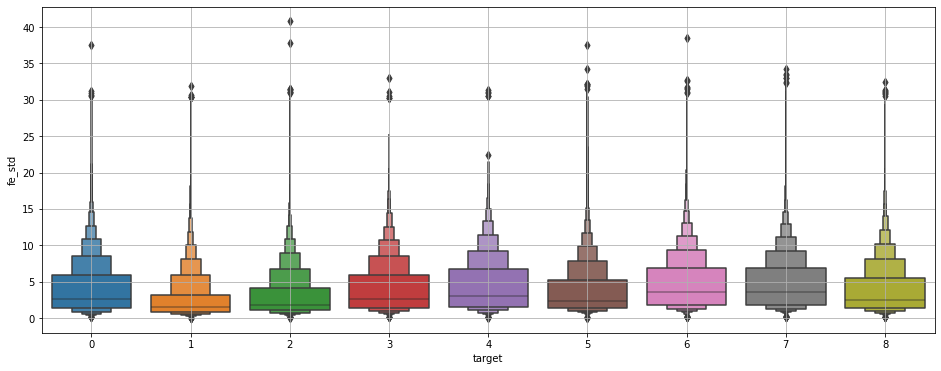

In [340]:
for stat in ['max', 'median', 'mean', 'std']:
    plt.figure(figsize=(16,6))
    sns.boxenplot(x=TARGET_NAME, y=f'fe_{stat}', data=train_data)
    plt.grid()
    plt.show()

CPU times: user 1min 35s, sys: 655 ms, total: 1min 36s
Wall time: 1min 34s


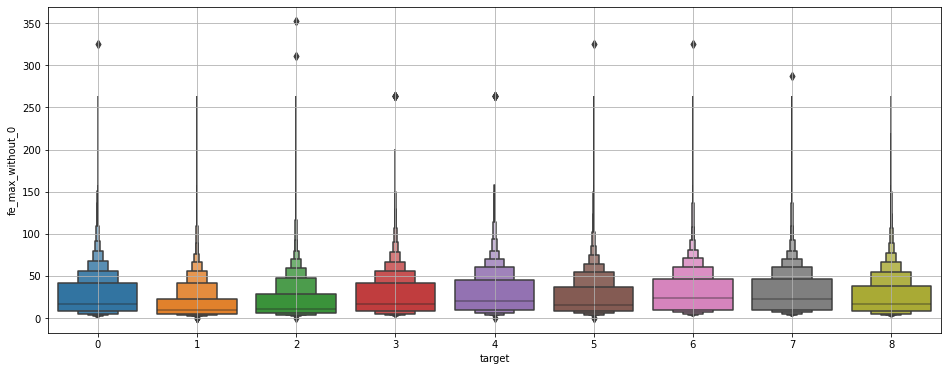

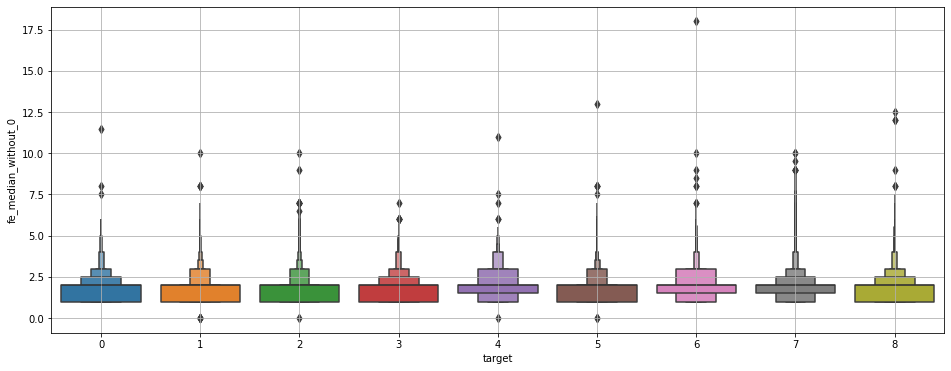

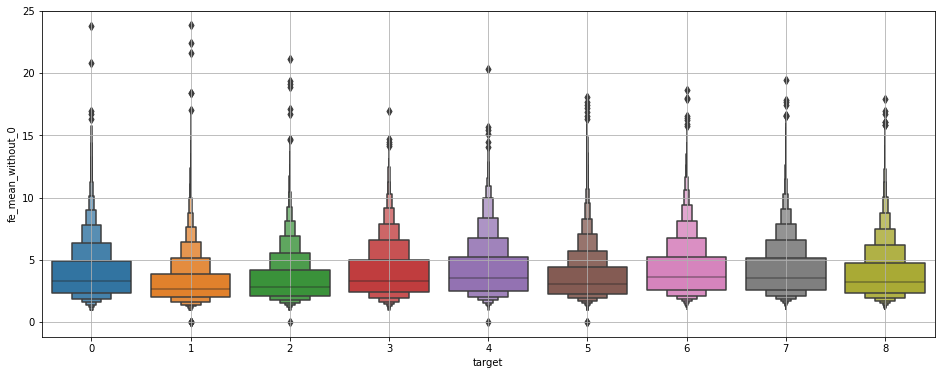

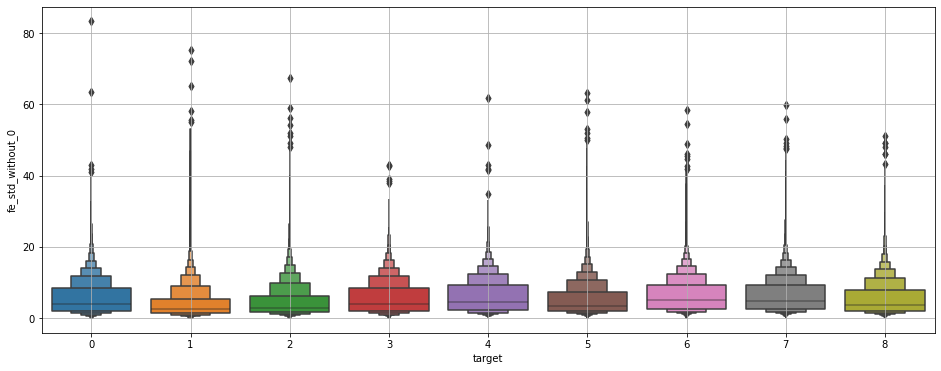

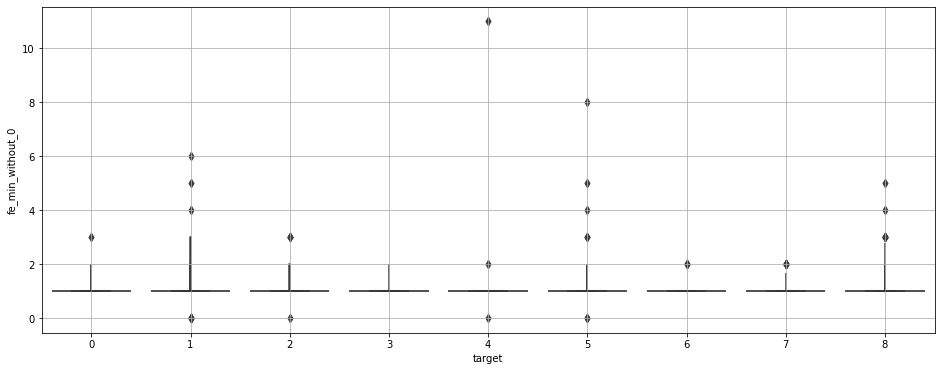

In [376]:
for stat in ['max', 'median', 'mean', 'std', 'min']:
    plt.figure(figsize=(16,6))
    sns.boxenplot(x=TARGET_NAME, y=f'fe_{stat}_without_0', data=train_data)
    plt.grid()
    plt.show()

## Look at deviation from mean of each calss 

In [413]:
def get_deviation(train, test, f, stat):
    train[TARGET_NAME] = train_data[TARGET_NAME]
    refer_values = train.groupby([TARGET_NAME]).agg({f:stat}).T
    return pd.DataFrame(test[[f]].values - refer_values.values,
                columns=[f'dev_{f}_{stat}_{target}' for target in refer_values.columns])

mean_feat = [f'feature_{f}' for f in [18, 12]]

frames = []
for f in mean_feat:
    frames.append(get_deviation(X, X, f, 'mean'))

In [414]:
for frame in frames:
    frame[TARGET_NAME] = train_data[TARGET_NAME]

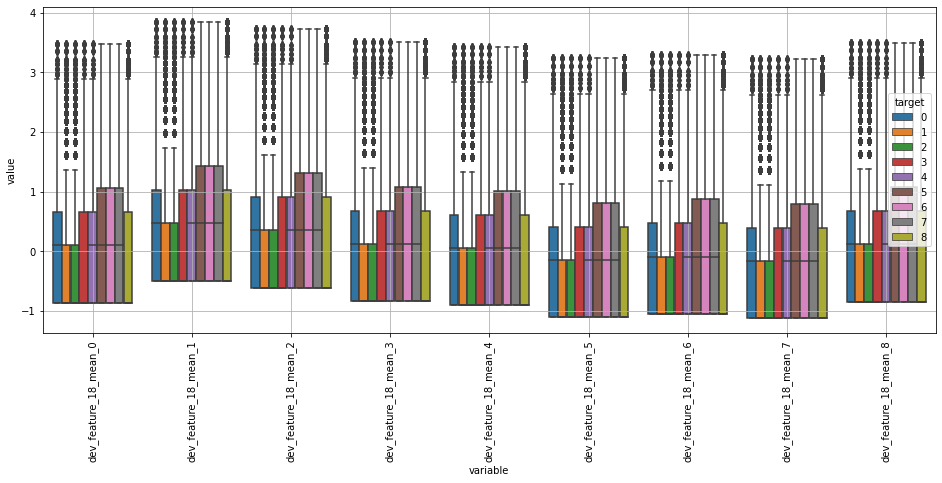

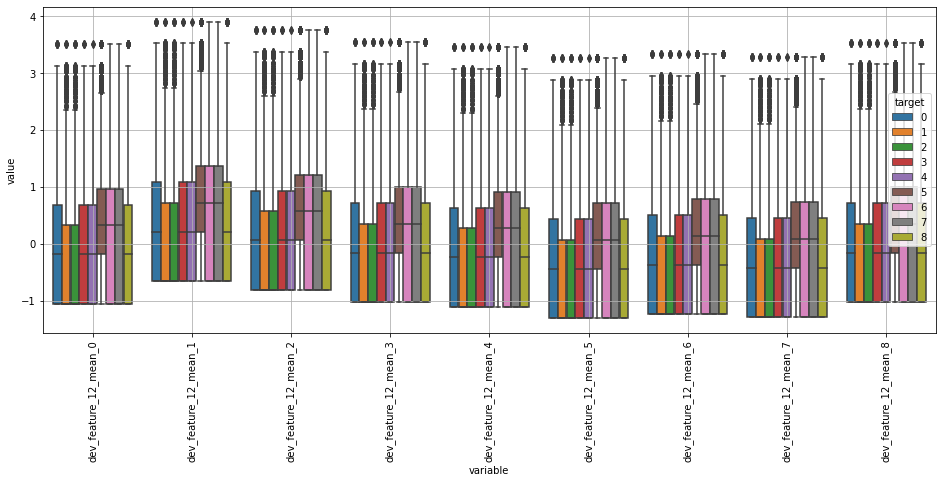

In [417]:
for frame in frames:
    temp = frame.melt(id_vars=TARGET_NAME)
    plt.figure(figsize=(16,6))
    sns.boxplot(x='variable', y='value', hue=TARGET_NAME, data=temp)
    plt.grid()
    plt.xticks(rotation=90)
    plt.show()



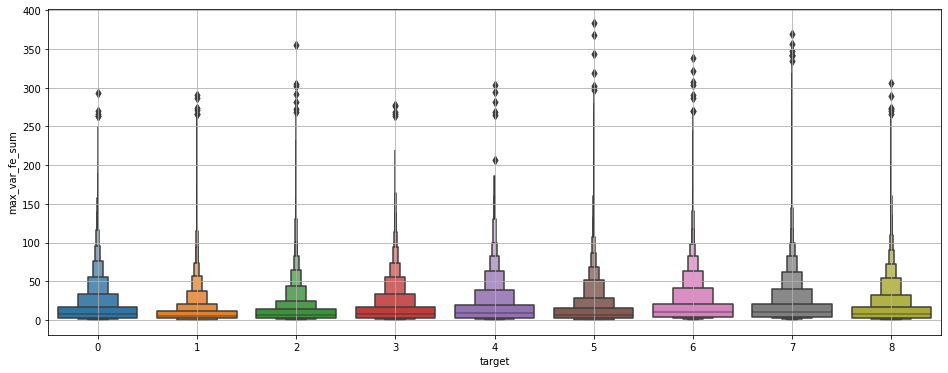

In [420]:
plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='max_var_fe_sum', data=train_data)
plt.grid()
plt.show()

## Add features to test

In [429]:
%%time
for i in range(4):
    test_data[f'{i}_counts'] = test_data[features].apply(lambda row: (row == i).sum(), axis=1)
    
test_data['fe_sum'] = test_data[features].apply(lambda row: row.sum(), axis=1)

for stat in ['mean', 'std']:
    test_data[f'fe_{stat}'] = test_data[features].apply(lambda row: row.apply(stat), axis=1)

for stat in ['max', 'median']:
    test_data[f'fe_{stat}_without_0'] = test_data[features].apply(lambda row: row[row!=0].apply(stat), axis=1)
    test_data[f'fe_{stat}_without_0']  = test_data[f'fe_{stat}_without_0'].explode().fillna(0)

CPU times: user 2min 15s, sys: 345 ms, total: 2min 15s
Wall time: 2min 14s


In [430]:
print(train_data.shape)
print(test_data.shape)

(200000, 86)
(100000, 85)


### 3. Transformed features distributions

In [ ]:
#all_df = pd.concat([train_data, test_data]).reset_index(drop = True)

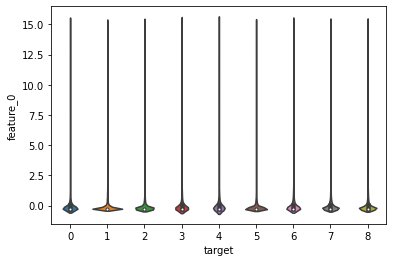

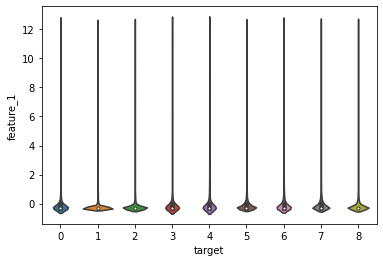

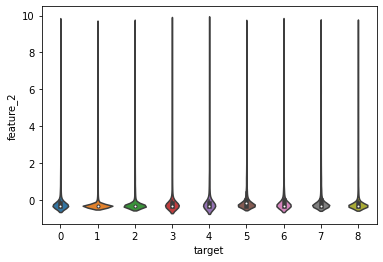

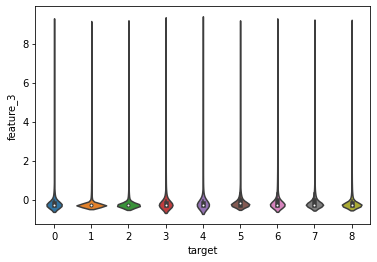

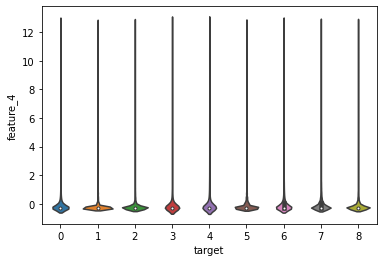

...

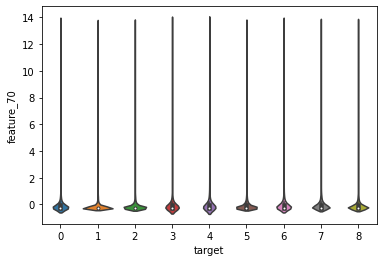

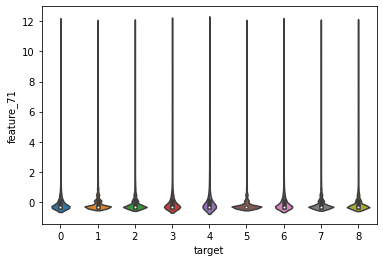

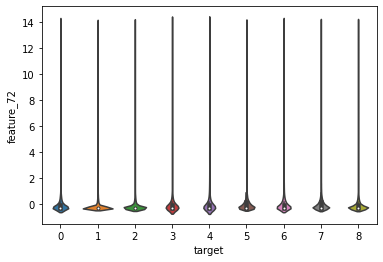

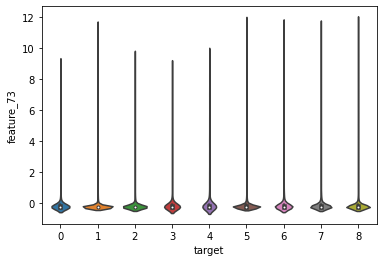

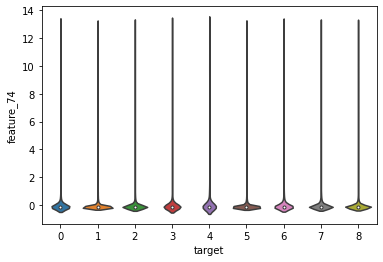

In [23]:
st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features)
st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
for f in features:
    sns.violinplot(x=TARGET_NAME, y=f, data=st_feat_val)
    plt.show()

In [ ]:
# st_feat_val = pd.DataFrame(StandardScaler().fit_transform(np.sin(train_data[features])), columns=features)
# st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
# for f in features:
#     sns.violinplot(x=TARGET_NAME, y=f, data=st_feat_val)
#     plt.show()

In [ ]:
# st_feat_val = pd.DataFrame(StandardScaler().fit_transform(np.cos(train_data[features])), columns=features)
# st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
# for f in features:
#     sns.violinplot(x=TARGET_NAME, y=f, data=st_feat_val)
#     plt.show()

In [ ]:
# st_feat_val = pd.DataFrame(StandardScaler().fit_transform(np.tan(train_data[features])), columns=features)
# st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
# for f in features:
#     sns.violinplot(x=TARGET_NAME, y=f, data=st_feat_val)
#     plt.show()

## Statistics change in dependence of target
### 4.1 Mean

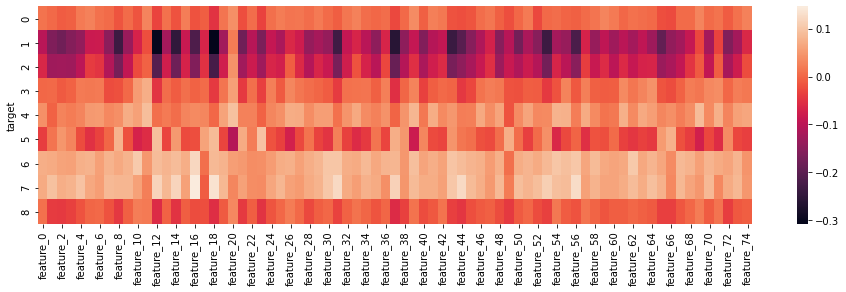

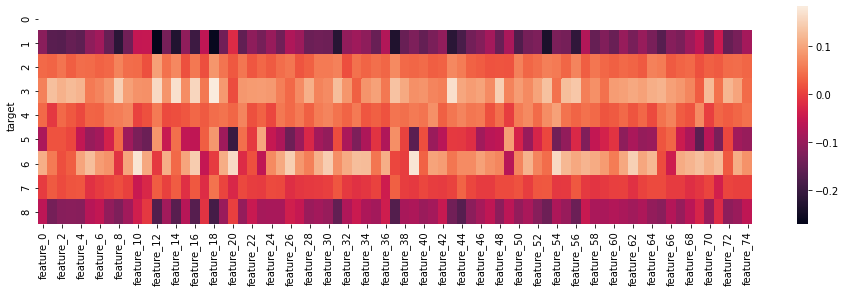

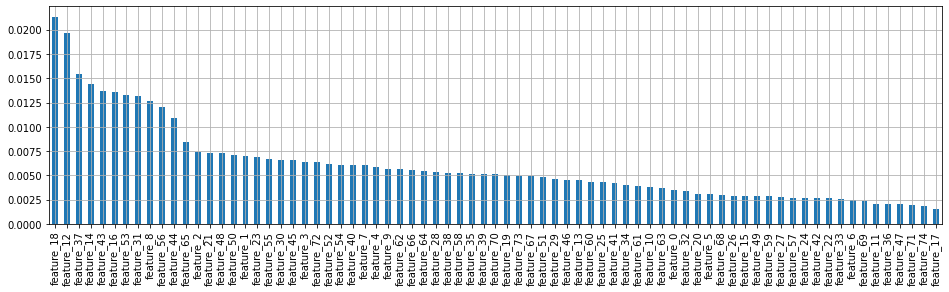

In [377]:
st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features)
st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]

#st_feat_val = train_data[train_data.columns[1:]]

plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].mean())
plt.show()
plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].mean().diff(1))
plt.show()

st_feat_val.groupby([TARGET_NAME])[features].mean().var().sort_values(ascending=False).plot(kind='bar', figsize=(16,4))
plt.grid()
plt.show()

### 4.2 Std

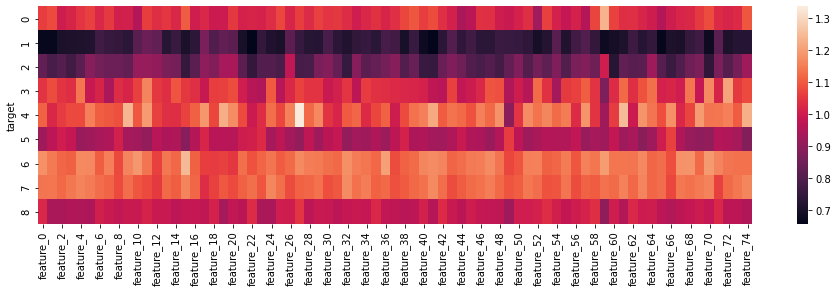

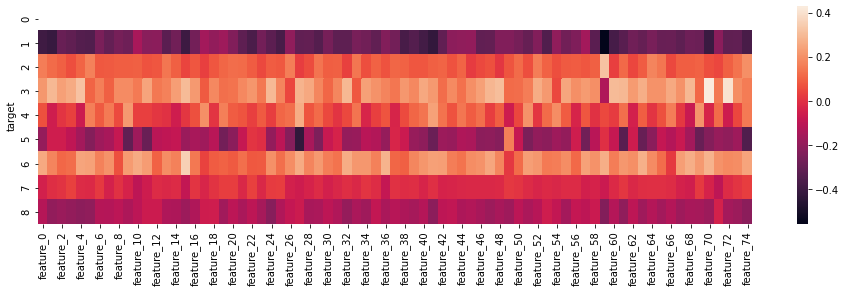

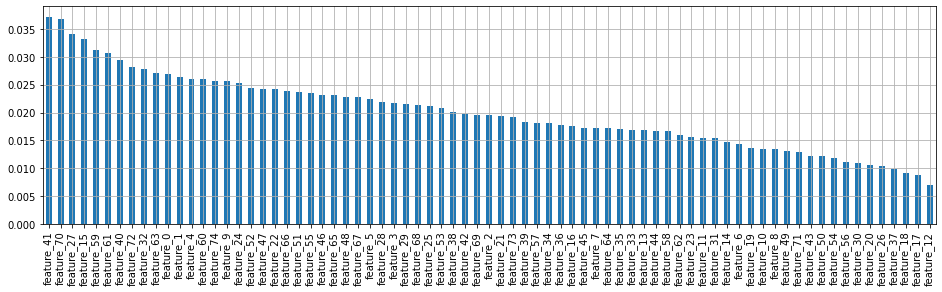

In [24]:
st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features)
st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].std())
plt.show()

plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].std().diff(1))
plt.show()

st_feat_val.groupby([TARGET_NAME])[features].std().var().sort_values(ascending=False).plot(kind='bar', figsize=(16,4))
plt.grid()
plt.show()

### 4.3 Median

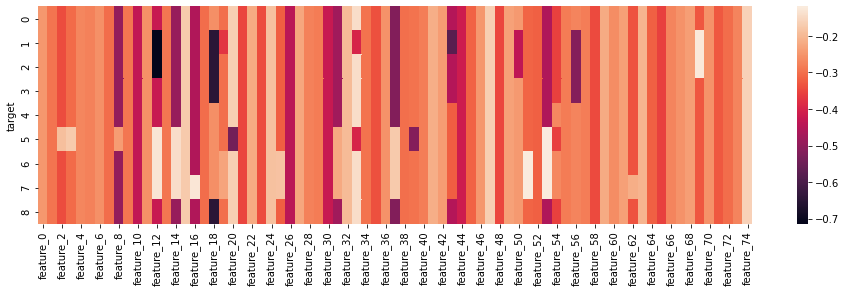

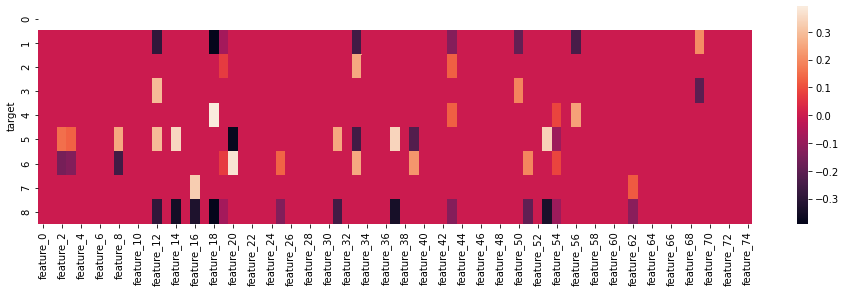

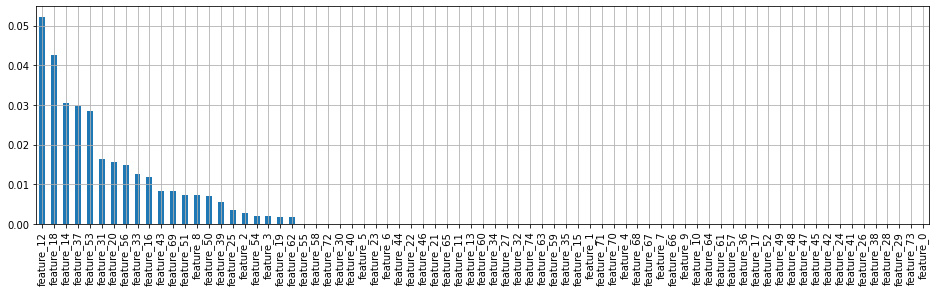

In [26]:
st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features)
st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].median())
plt.show()

plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].median().diff(1))
plt.show()

st_feat_val.groupby([TARGET_NAME])[features].median().var().sort_values(ascending=False).plot(kind='bar', figsize=(16,4))
plt.grid()
plt.show()

### 4.4 Min

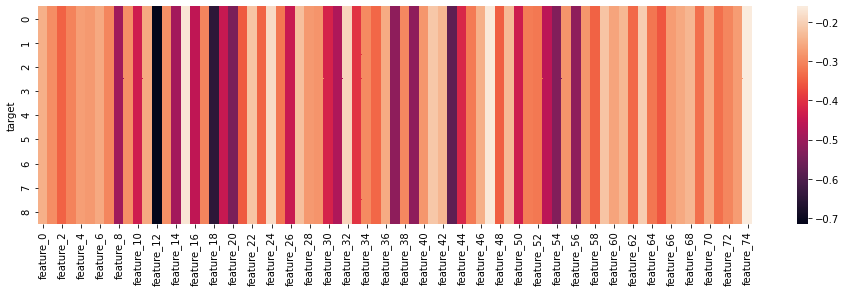

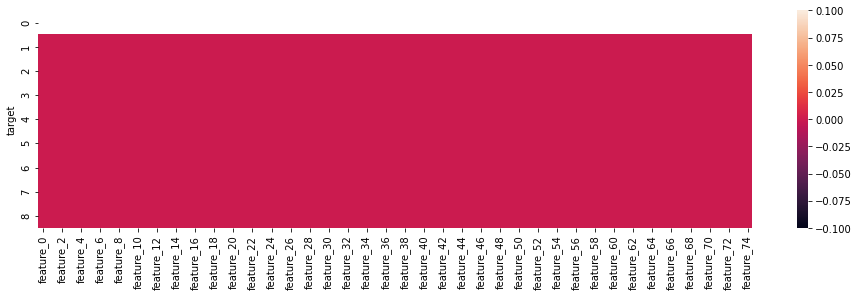

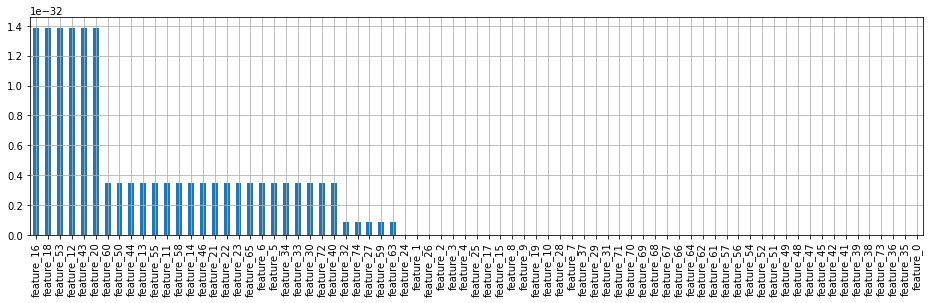

In [27]:
st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features)
st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].min())
plt.show()

plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].min().diff(1))
plt.show()


st_feat_val.groupby([TARGET_NAME])[features].min().var().sort_values(ascending=False).plot(kind='bar', figsize=(16,4))
plt.grid()
plt.show()

### 4.5 Max

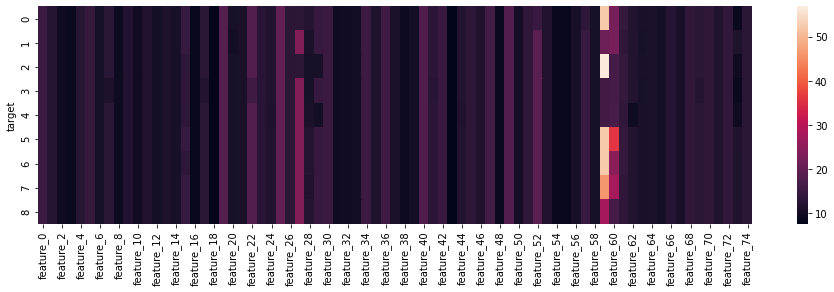

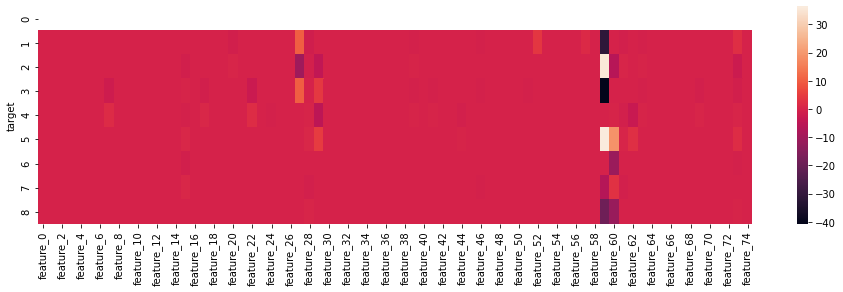

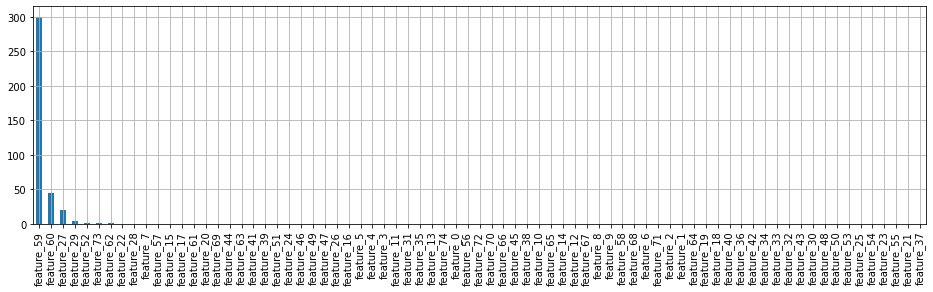

In [28]:
st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features)
st_feat_val[TARGET_NAME] = train_data[TARGET_NAME]
plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].max())
plt.show()

plt.figure(figsize=(16,4))
sns.heatmap(st_feat_val.groupby([TARGET_NAME])[features].max().diff(1))
plt.show()


st_feat_val.groupby([TARGET_NAME])[features].max().var().sort_values(ascending=False).plot(kind='bar', 
                                                                                           figsize=(16,4))
plt.grid()
plt.show()

## PCA feature analisys and dimension reduction


In [182]:
pca_features = [f'pca_{f}' for f in features]
pca_train = pd.DataFrame(PCA().fit_transform(train_data[features]), columns=pca_features)
pca_train[TARGET_NAME] = train_data[TARGET_NAME]

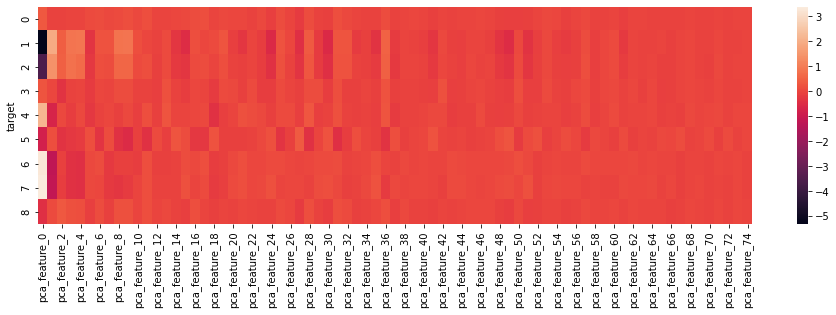

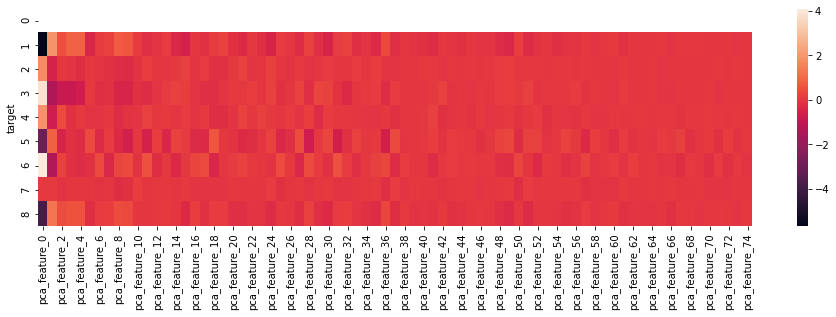

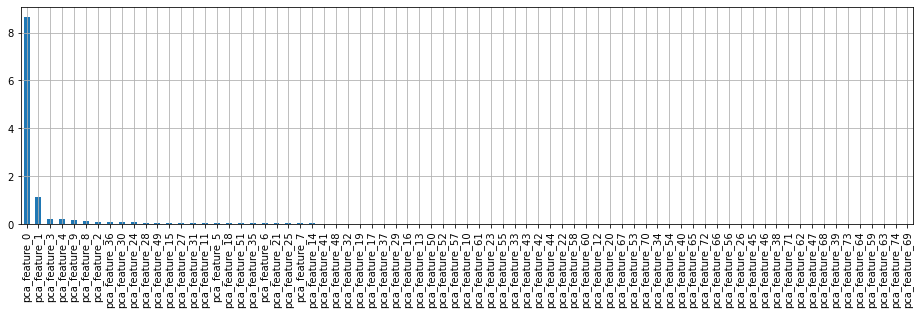

In [183]:
pca_train[TARGET_NAME] = train_data[TARGET_NAME]
plt.figure(figsize=(16,4))
sns.heatmap(pca_train.groupby([TARGET_NAME])[pca_features].mean())
plt.show()
plt.figure(figsize=(16,4))
sns.heatmap(pca_train.groupby([TARGET_NAME])[pca_features].mean().diff(1))
plt.show()

pca_train.groupby([TARGET_NAME])[pca_features].mean().var().sort_values(ascending=False).plot(kind='bar', figsize=(16,4))
plt.grid()
plt.show()

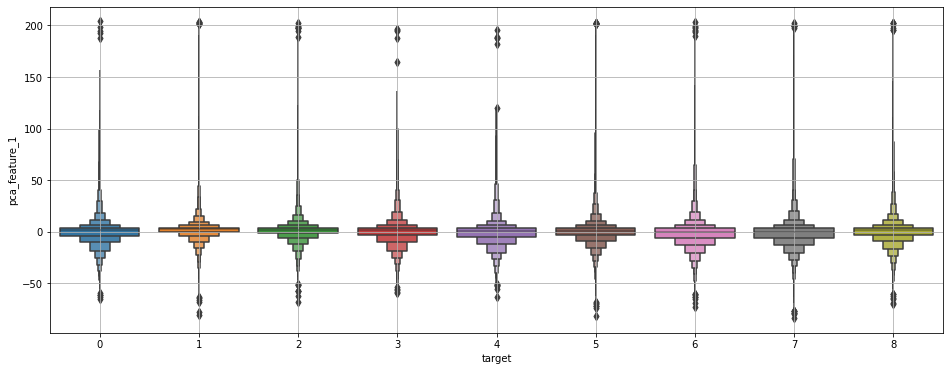

In [190]:
plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='pca_feature_1', data=pca_train)
plt.grid()
plt.show()

In [215]:
pca_2 = PCA(n_components=2, random_state=random_state)
pca_2_train = pd.DataFrame(pca_2.fit_transform(\
                           StandardScaler().fit_transform(train_data[features])), 
                         columns=['pca_feature_1', 'pca_feature_2'])
pca_2_train[TARGET_NAME] = train_data[TARGET_NAME]

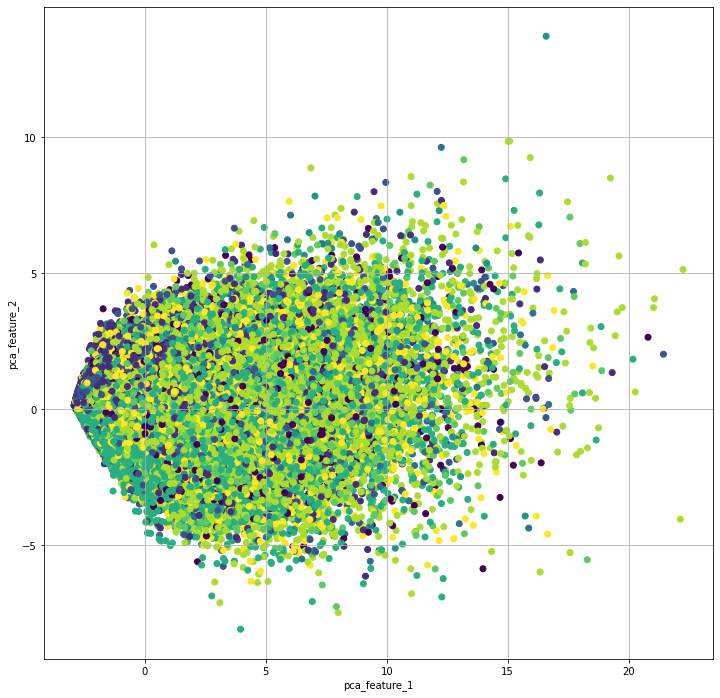

In [216]:
    plt.figure(figsize=(12,12))
    plt.scatter(pca_2_train['pca_feature_1'], pca_2_train['pca_feature_2'], c=pca_2_train[TARGET_NAME])
    plt.grid()
    plt.xlabel('pca_feature_1')
    plt.ylabel('pca_feature_2')
    plt.show()

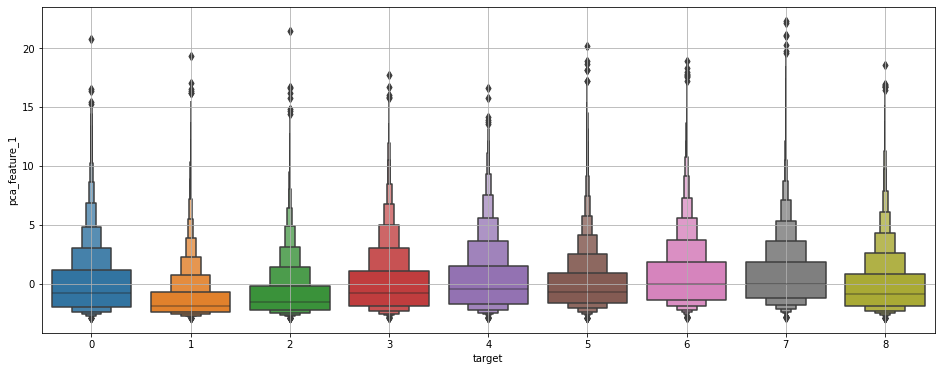

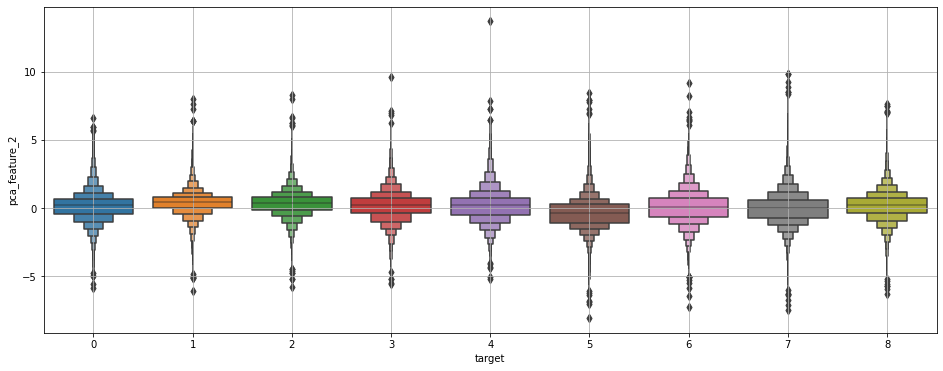

In [217]:
plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='pca_feature_1', data=pca_2_train)
plt.grid()
plt.show()

plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='pca_feature_2', data=pca_2_train)
plt.grid()
plt.show()

In [218]:
%%time
tsne_2 = TSNE(n_components=2, perplexity=30)
tsne_2_train = pd.DataFrame(tsne_2.fit_transform(\
                           StandardScaler().fit_transform(train_data[features])), 
                         columns=['tsne_feature_1', 'tsne_feature_2'])
tsne_2_train[TARGET_NAME] = train_data[TARGET_NAME]

CPU times: user 2h 7min 31s, sys: 34min 37s, total: 2h 42min 8s
Wall time: 25min 41s


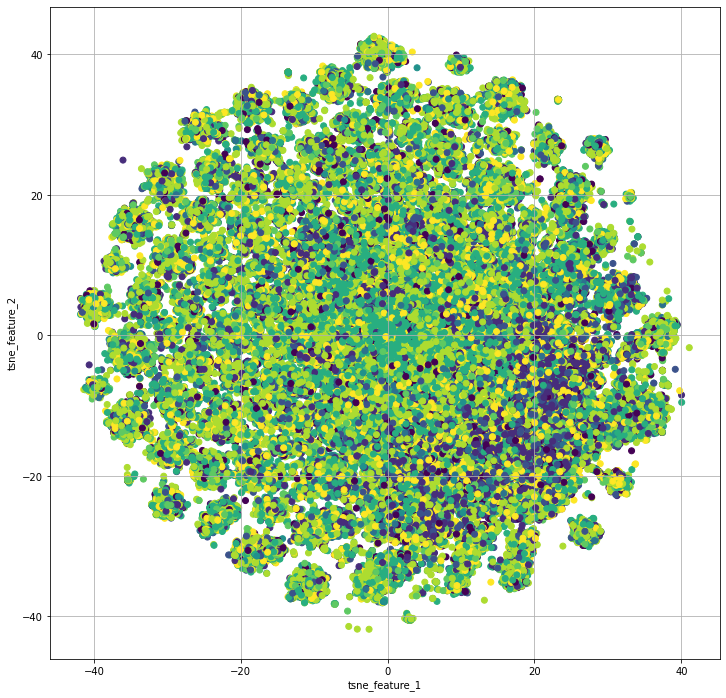

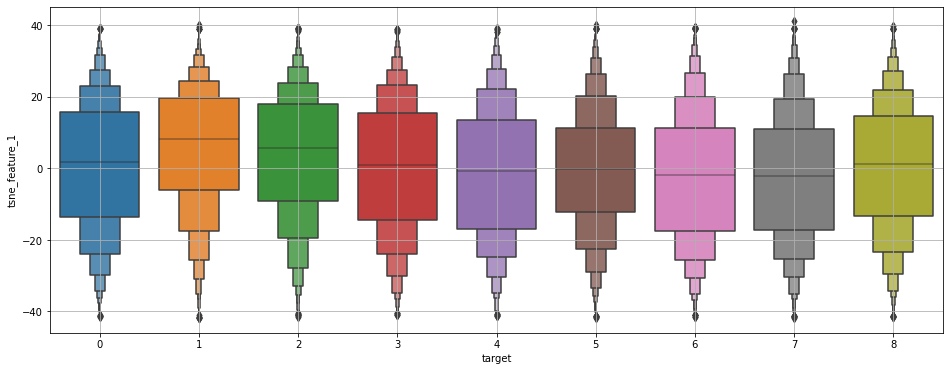

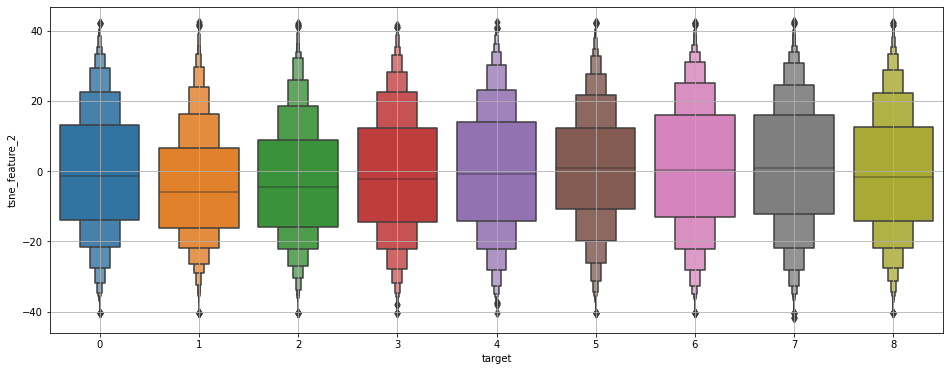

In [219]:
plt.figure(figsize=(12,12))
plt.scatter(tsne_2_train['tsne_feature_1'], tsne_2_train['tsne_feature_2'], c=tsne_2_train[TARGET_NAME])
plt.grid()
plt.xlabel('tsne_feature_1')
plt.ylabel('tsne_feature_2')
plt.show()
    
plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='tsne_feature_1', data=tsne_2_train)
plt.grid()
plt.show()

plt.figure(figsize=(16,6))
sns.boxenplot(x=TARGET_NAME, y='tsne_feature_2', data=tsne_2_train)
plt.grid()
plt.show()

## Hierarchical analisys and clustering

In [213]:
# st_feat_val = pd.DataFrame(StandardScaler().fit_transform(train_data[features]), columns=features).sample(10000)
# linked = linkage(st_feat_val, method = 'ward')

# plt.figure(figsize=(16, 10))  
# dendrogram(linked,
#             orientation='top')
# plt.title('Hierarchial clustering' )
# plt.xticks([])
# plt.show()

## Explore combinations of features

In [9]:
pair_feat = [c for c in itertools.combinations(features, 2)]

In [10]:
%%time
pair_data = train_data.copy()
for pair in pair_feat:
    pair_data[pair[0] + '*' + pair[1]]  = pair_data[pair[0]] * pair_data[pair[1]]
    #pair_data[pair[0] + '-' + pair[1]]  = pair_data[pair[0]] - pair_data[pair[1]]
    #pair_data[pair[0] + '+' + pair[1]]  = pair_data[pair[0]] + pair_data[pair[1]]

CPU times: user 17.7 s, sys: 14.1 s, total: 31.8 s
Wall time: 28.5 s


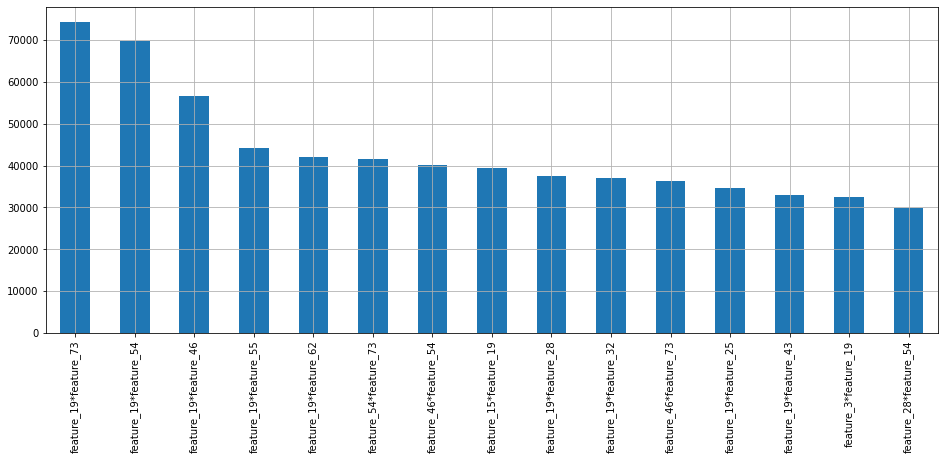

AttributeError: 'Series' object has no attribute 'columns'

In [16]:
filt_feat = pair_data.filter(like='*').columns
temp = pair_data[filt_feat].var().sort_values(ascending=False).head(15)
temp.plot(kind='bar', figsize=(16,6))
plt.grid()
plt.show()



In [ ]:
train_data[TARGET_NAME].value_counts().plot(kind='bar')
plt.grid()

## Deviation features
1. Main idea - that observation value for group member less differ than group statistic 

In [120]:
# %%time
def get_deviation(train, test, f, stat):
    refer_values = train.groupby([TARGET_NAME]).agg({f:stat}).T
    return pd.DataFrame(test[[f]].values - refer_values.values,
                columns=[f'dev_{f}_{stat}_{target}' for target in refer_values.columns])

# mean_feat = [f'feature_{f}' for f in [2, 13, 22, 16]]
# min_feat = [f'feature_{f}' for f in [38, 32, 39, 42, 30, 35, 19]]
# max_feat = [f'feature_{f}' for f in [30, 29, 25]]
# std_feat = [f'feature_{f}' for f in [30, 2, 13, 32, 26]]

# frames = []
# for f in mean_feat:
#     frames.append(get_deviation(train_data, train_data, f, 'mean'))
# for f in min_feat:
#     frames.append(get_deviation(train_data, train_data, f, 'min'))
# for f in max_feat:
#     frames.append(get_deviation(train_data, train_data, f, 'max'))
# for f in std_feat:
#     frames.append(get_deviation(train_data, train_data, f, 'std'))    
    
# frames.append(train_data)
# train_data = pd.concat(frames, axis=1)   

## 5. Modeling baseline

In [57]:
def confusion_matrix_plot(y_valid, y_pred, class_names):
    conf_mat = pd.DataFrame(confusion_matrix(y_valid, y_pred), index=class_names, 
                            columns=class_names)
                            
    conf_mat = conf_mat.div(conf_mat.sum(axis=1), axis=0)             
    plt.figure(figsize=(12,12))
    sns.heatmap(conf_mat, annot=True, fmt='.3%', vmax=0.5)
    plt.show()
    
    
    
def classification_scorer_roc_plot(model, X_valid, y_valid):
    
    probabilities_valid = model.predict_proba(X_valid)
    probabilities_one_valid = probabilities_valid[:, 1]
    y_predict = model.predict(X_valid)
    
    auc_roc = roc_auc_score(y_valid, probabilities_one_valid)
    f1 = f1_score(y_valid, y_predict)
    
    print(f'AUC ROC: {auc_roc}')
    print(f'f1 score {f1}')
  
        
    
    fpr, tpr, thresholds = roc_curve(y_valid, probabilities_one_valid) 

    plt.figure(figsize=(12,12))
    plt.plot(fpr, tpr)
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC-curve')
    plt.grid()
    plt.show()    

## Split and Transform features

In [12]:
scaler = StandardScaler()

In [23]:
f_cols = list(top_columns) + list(features)

In [13]:
X = train_data.drop(columns=['id', TARGET_NAME])
y = train_data[TARGET_NAME]
# X = pair_data.drop(columns=['id', TARGET_NAME])[f_cols]
# y = pair_data[TARGET_NAME]

X = np.log1p(X)
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=random_state)

## Binary output

In [30]:
def make_binary(y, target):
    return y.apply(lambda row: 1 if row == target else 0)

In [35]:
y_8 = make_binary(y, 8)

X = train_data.drop(columns=['id', TARGET_NAME])
X = np.log1p(X)
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

X_train, X_test, y_train, y_test = train_test_split(X, y_8, test_size=0.25, random_state=random_state)

## KBins

In [86]:
# kbins = KBinsDiscretizer(n_bins=[20] * len(features), encode='ordinal').fit(X)
# bins_col = features + '_bins'
# X[bins_col] = kbins.transform(X)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=random_state)

## Ploynomial transform

In [25]:
# poly_fe = PolynomialFeatures(degree=2, interaction_only=True)
# poly_fe.fit_transform(train_data[features].head(100)).shape

(100, 2851)

## Add PCA features

In [ ]:
# X_train[['pca_feature_1', 'pca_feature_2']] = pca_2_train[['pca_feature_1', 
#                                                            'pca_feature_2']].loc[X_train.index]

# X_test[['pca_feature_1', 'pca_feature_2']] = pca_2_train[['pca_feature_1', 
#                                                            'pca_feature_2']].loc[X_test.index]

In [15]:
# n_comp = 70
# pca_cols = [f'pca_feature_{i}' for i in range(n_comp)]
# pca_70 = PCA(n_components=n_comp, random_state=random_state)
# pca_70_train = pd.DataFrame(pca_70.fit_transform(\
#                            scaler.fit_transform(train_data[features])), 
#                          columns=pca_cols)
# pca_70_train[TARGET_NAME] = train_data[TARGET_NAME]

## DT

In [11]:
# %%time
# tree = DecisionTreeClassifier(max_depth=20, min_samples_leaf=10, 
#                               class_weight='balanced', random_state=random_state)
# tree.fit(X_train, y_train)

CPU times: user 3 s, sys: 0 ns, total: 3 s
Wall time: 3 s


F1 score train: 0.3076924908311252
LogLoss score train: 1.7334019834835819
F1 score test: 0.2048185449301426
LogLoss score test: 5.670633930407283


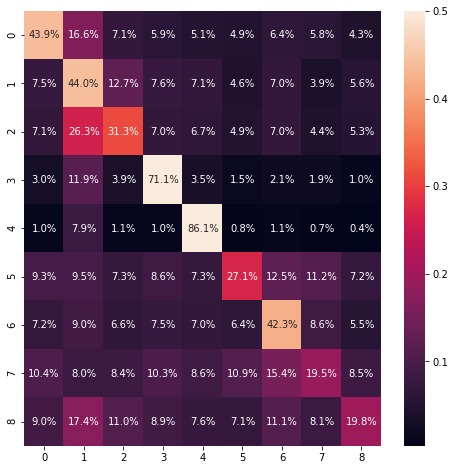

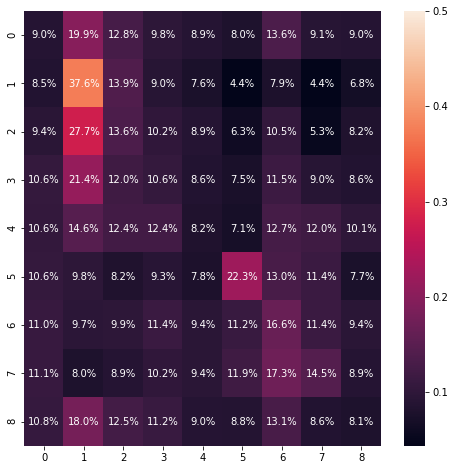

In [12]:
# y_tr_pred_prob = tree.predict_proba(X_train)
# y_tr_pred = tree.predict(X_train)
# f1 = f1_score(y_train, y_tr_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_train).values, y_tr_pred_prob)
# print(f'F1 score train: {f1}')
# print(f'LogLoss score train: {ll}')

# y_te_pred_prob = tree.predict_proba(X_test)
# y_te_pred = tree.predict(X_test)
# f1 = f1_score(y_test, y_te_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_test).values, y_te_pred_prob)
# print(f'F1 score test: {f1}')
# print(f'LogLoss score test: {ll}')

# confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(9)))
# confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(9)))

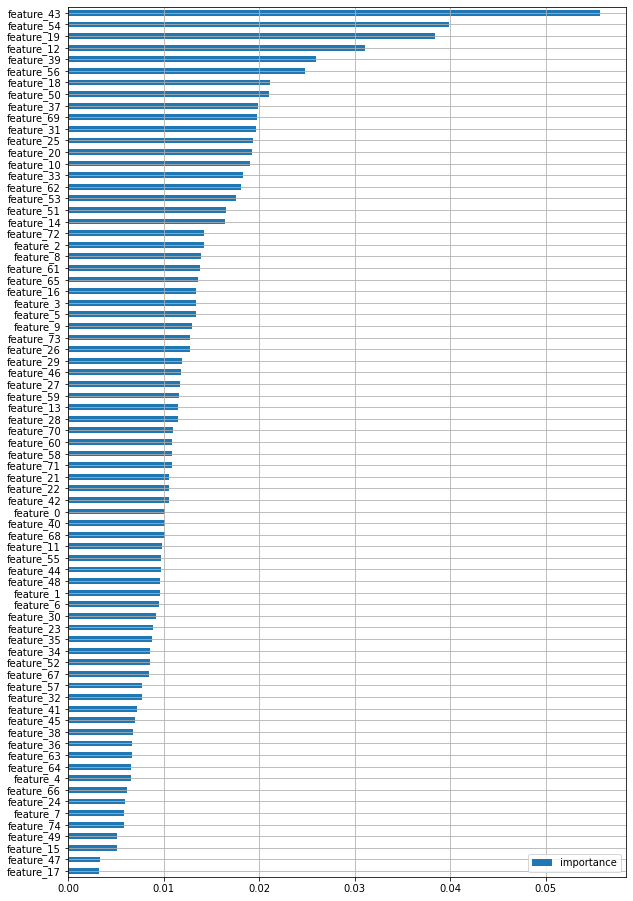

In [180]:
pd.DataFrame(tree.feature_importances_, 
             index=X_train.columns, 
             columns=['importance'])\
 .sort_values('importance', ascending=True)\
 .plot(kind='barh', figsize=(10,16))
plt.grid()
plt.show()

## RF

In [13]:
# %%time
# rfc = RandomForestClassifier(n_estimators=1000, 
#                              max_depth=10, 
#                              min_samples_leaf=5, 
#                              class_weight='balanced', 
#                              random_state=random_state, n_jobs=-1)
# rfc.fit(X_train, y_train)

CPU times: user 9min 15s, sys: 1.41 s, total: 9min 16s
Wall time: 52.1 s


F1 score train: 0.396753969537539
LogLoss score train: 1.992340518544521
F1 score test: 0.29459707773604593
LogLoss score test: 2.0376318950035675


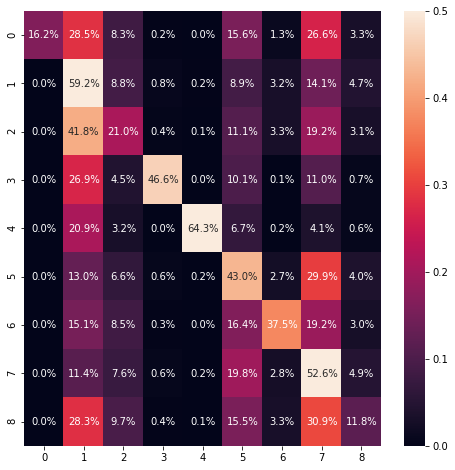

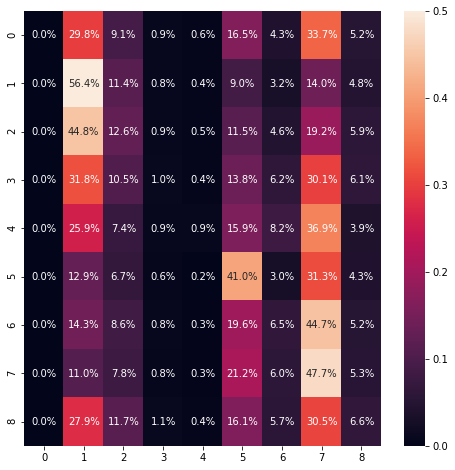

In [14]:
# y_tr_pred_prob = rfc.predict_proba(X_train)
# y_tr_pred = rfc.predict(X_train)
# f1 = f1_score(y_train, y_tr_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_train).values, y_tr_pred_prob)
# print(f'F1 score train: {f1}')
# print(f'LogLoss score train: {ll}')

# y_te_pred_prob = rfc.predict_proba(X_test)
# y_te_pred = rfc.predict(X_test)
# f1 = f1_score(y_test, y_te_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_test).values, y_te_pred_prob)
# print(f'F1 score test: {f1}')
# print(f'LogLoss score test: {ll}')

# confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(9)))
# confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(9)))

In [132]:
# train_proba = train_data[['id']].copy()
# train_proba[submission.columns[1:]] = rfc.predict_proba(X)
# train_proba[TARGET_NAME] = train_data[TARGET_NAME]
# train_proba.to_csv('../../../data/kaggle/TPS_JUNE2021/rfc_baseline_train_proba.csv', index = False)

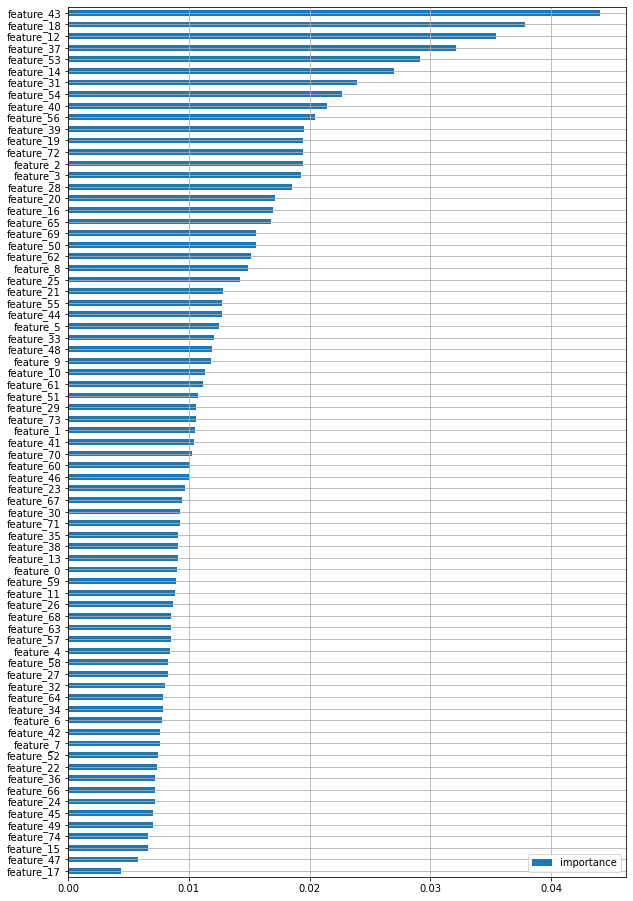

In [179]:
pd.DataFrame(rfc.feature_importances_, 
             index=X_train.columns, 
             columns=['importance'])\
 .sort_values('importance', ascending=True)\
 .plot(kind='barh', figsize=(10,16))
plt.grid()
plt.show()

## SVC

In [15]:
# %%time
# svm = SVC(class_weight='balanced', probability=True, random_state=random_state)
# svm.fit(X_train, y_train)

CPU times: user 11h 37min 27s, sys: 17.8 s, total: 11h 37min 45s
Wall time: 11h 37min 45s


F1 score train: 0.3665788329590433
LogLoss score train: 1.7025138913881888
F1 score test: 0.27109455761553736
LogLoss score test: 1.7888134894569687


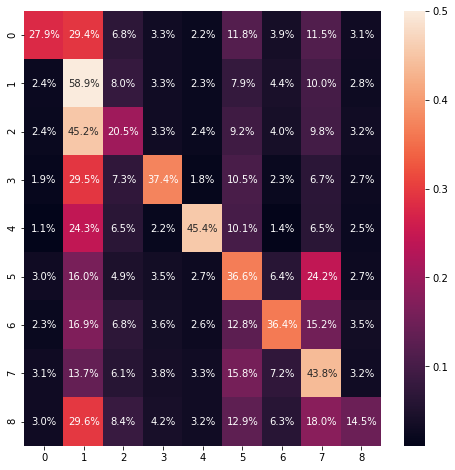

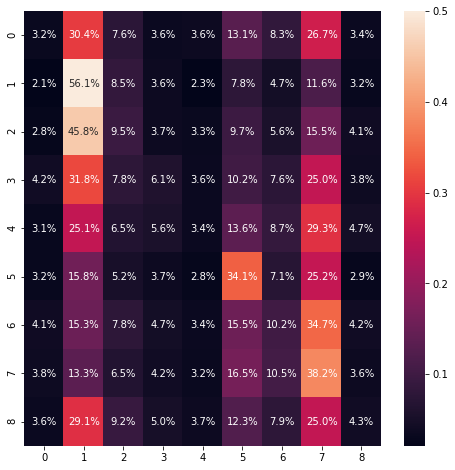

In [16]:
# y_tr_pred_prob = svm.predict_proba(X_train)
# y_tr_pred = svm.predict(X_train)
# f1 = f1_score(y_train, y_tr_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_train).values, y_tr_pred_prob)
# print(f'F1 score train: {f1}')
# print(f'LogLoss score train: {ll}')

# y_te_pred_prob = svm.predict_proba(X_test)
# y_te_pred = svm.predict(X_test)
# f1 = f1_score(y_test, y_te_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_test).values, y_te_pred_prob)
# print(f'F1 score test: {f1}')
# print(f'LogLoss score test: {ll}')

# confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(9)))
# confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(9)))

In [137]:
# train_proba = train_data[['id']].copy()
# train_proba[submission.columns[1:]] = svm.predict_proba(X)
# train_proba[TARGET_NAME] = train_data[TARGET_NAME]
# train_proba.to_csv('../../../data/kaggle/TPS_JUNE2021/svm_baseline_train_proba.csv', index = False)

## KNN

In [37]:
knn = KNeighborsClassifier(n_neighbors=10, n_jobs=-1)

In [96]:
%%time
knn.fit(X_train, y_train)

CPU times: user 280 ms, sys: 8.69 ms, total: 288 ms
Wall time: 677 ms


KNeighborsClassifier(n_jobs=-1, n_neighbors=10)

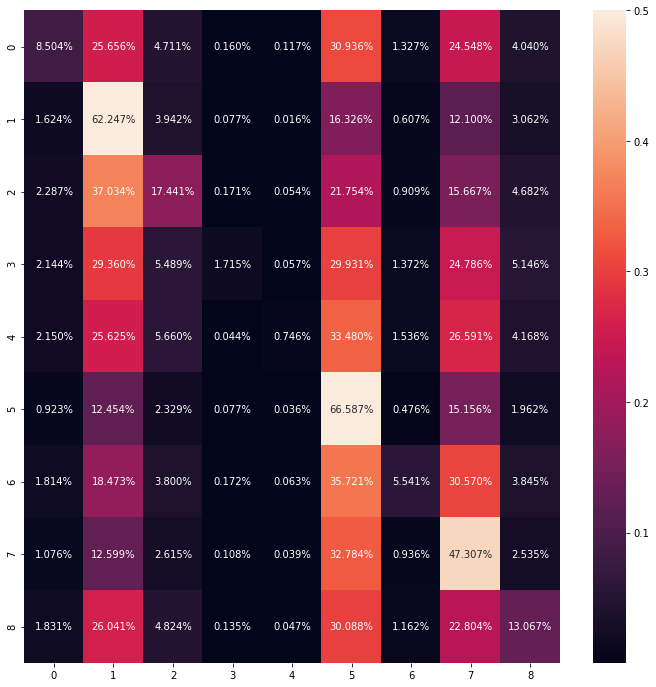

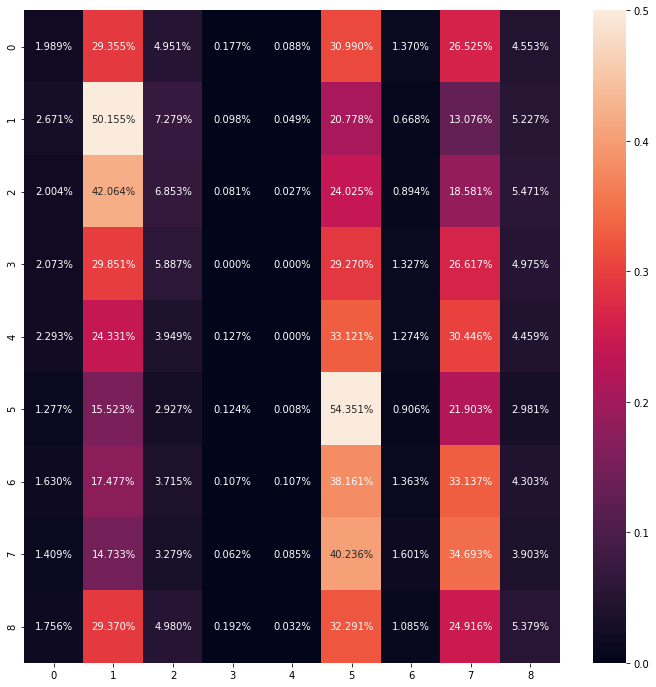

In [44]:
y_tr_pred_prob = knn.predict_proba(X_train)
y_tr_pred = knn.predict(X_train)
f1 = f1_score(y_train, y_tr_pred, average='weighted')
ll = log_loss(y_train, y_tr_pred_prob)
print(f'F1 score train: {f1}')
print(f'LogLoss score train: {ll}')

y_te_pred_prob = knn.predict_proba(X_test)
y_te_pred = knn.predict(X_test)
f1 = f1_score(y_test, y_te_pred, average='weighted')
ll = log_loss(y_test, y_te_pred_prob)
print(f'F1 score test: {f1}')
print(f'LogLoss score test: {ll}')
confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(9)))
confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(9)))

In [45]:
%%time
knn.fit(X, y)

CPU times: user 29.3 ms, sys: 3.96 ms, total: 33.3 ms
Wall time: 31.8 ms


KNeighborsClassifier(n_jobs=-1, n_neighbors=10)

## LGBM

## Default class weights

In [ ]:
#(n_estimators=1000, max_depth=5,

In [25]:
%%time
lgbmc_nb = LGBMClassifier(random_state=random_state)
lgbmc_nb.fit(X_train, y_train)

CPU times: user 2min 24s, sys: 223 ms, total: 2min 24s
Wall time: 12.9 s


In [435]:
# train_proba[submission.columns[1:]] = lgbmc_nb.predict_proba(X)
# train_proba[TARGET_NAME] = train_data[TARGET_NAME]
# train_proba.to_csv('../../../data/kaggle/TPS_JUNE2021/lgbm_fee_train_proba.csv', index = False)

F1 score train: 0.3112334098518357
LogLoss score train: 1.6481184464523526
F1 score test: 0.284098710442841
LogLoss score test: 1.754359622925486


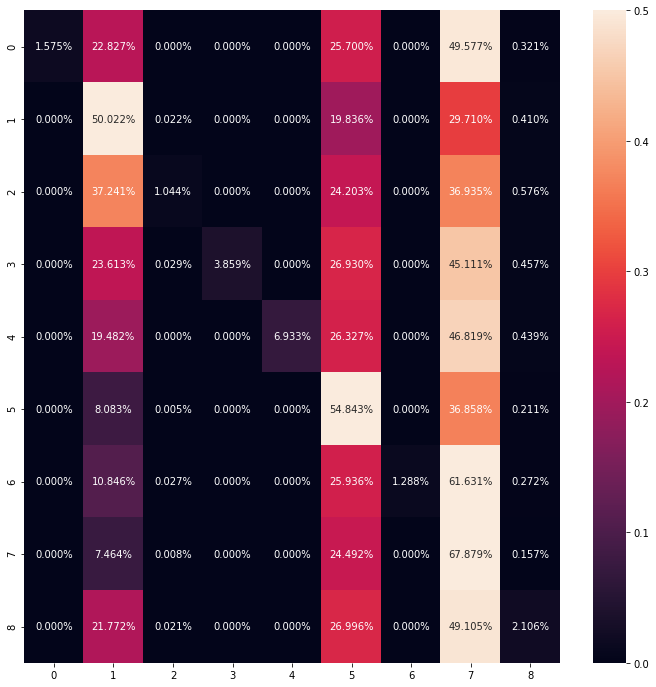

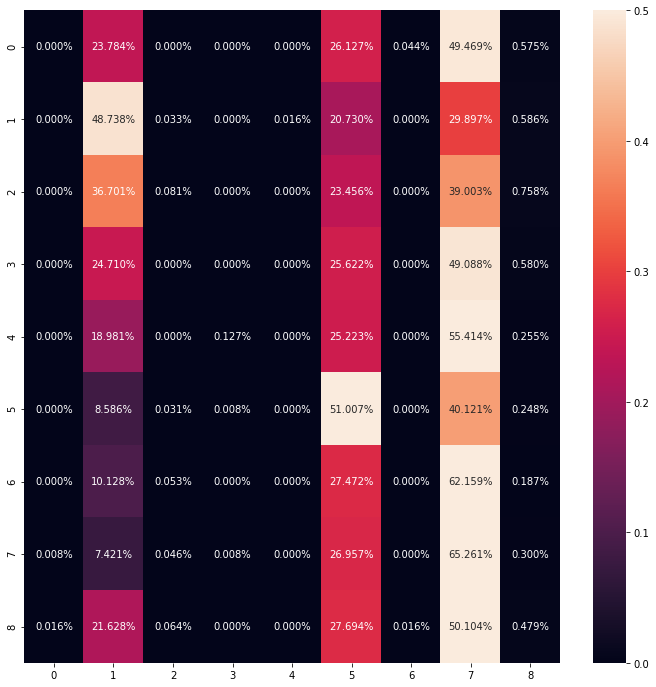

In [26]:
y_tr_pred_prob = lgbmc_nb.predict_proba(X_train)
y_tr_pred = lgbmc_nb.predict(X_train)
f1 = f1_score(y_train, y_tr_pred, average='weighted')
ll = log_loss(y_train, y_tr_pred_prob)
print(f'F1 score train: {f1}')
print(f'LogLoss score train: {ll}')

y_te_pred_prob = lgbmc_nb.predict_proba(X_test)
y_te_pred = lgbmc_nb.predict(X_test)
f1 = f1_score(y_test, y_te_pred, average='weighted')
ll = log_loss(y_test, y_te_pred_prob)
print(f'F1 score test: {f1}')
print(f'LogLoss score test: {ll}')

confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(9)))
confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(9)))

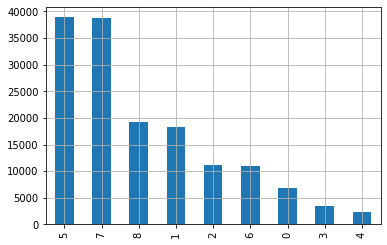

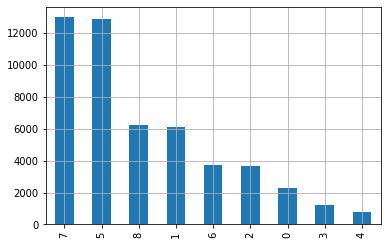

In [27]:
y_train.value_counts().plot(kind='bar')
plt.grid()
plt.show()
y_test.value_counts().plot(kind='bar')
plt.grid()
plt.show()

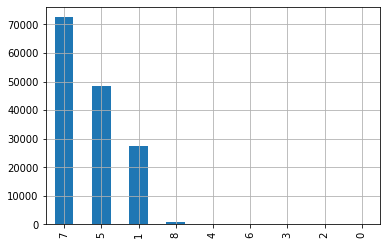

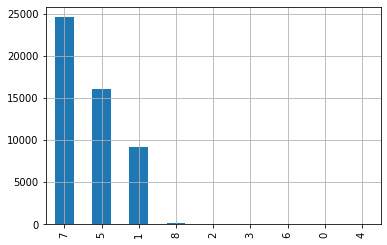

In [28]:
pd.Series(y_tr_pred).value_counts().plot(kind='bar')
plt.grid()
plt.show()

pd.Series(y_te_pred).value_counts().plot(kind='bar')
plt.grid()
plt.show()

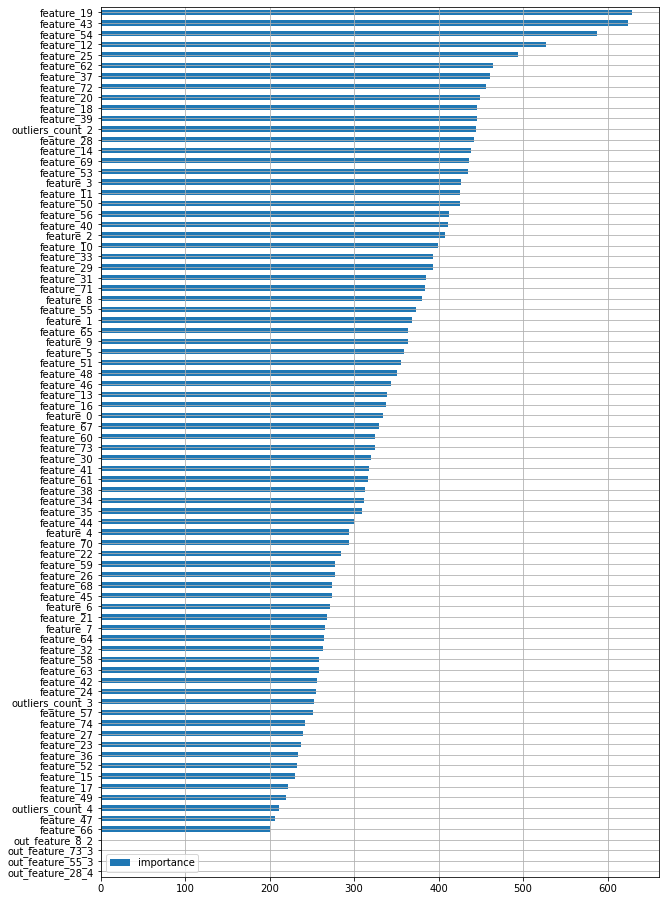

In [158]:
pd.DataFrame(lgbmc_nb.feature_importances_, 
             index=X_train.columns, 
             columns=['importance'])\
 .sort_values('importance', ascending=True)\
 .plot(kind='barh', figsize=(10,16))
plt.grid()
plt.show()

In [69]:
# %%time
# #lgbmc_nb = LGBMClassifier(n_estimators=100, random_state=0)
# lgbmc_nb.fit(X, y)

CPU times: user 52min 11s, sys: 4.14 s, total: 52min 15s
Wall time: 4min 27s


LGBMClassifier(max_depth=5, n_estimators=1000, random_state=0)

## Binary classifire for 8 class

In [40]:
y_train.value_counts()

0    130723
1     19277
Name: target, dtype: int64

In [65]:
%%time
lgbmc = LGBMClassifier(n_estimators=1000, 
                       max_depth=1, 
                       random_state=random_state,
                       class_weight='balanced')
lgbmc.fit(X_train, y_train)

CPU times: user 53 s, sys: 95.9 ms, total: 53 s
Wall time: 4.75 s


F1 score train: 0.25127370581916036
LogLoss score train: 0.6784121727002824
F1 score test: 0.23990278532825943
LogLoss score test: 0.6811192350471368


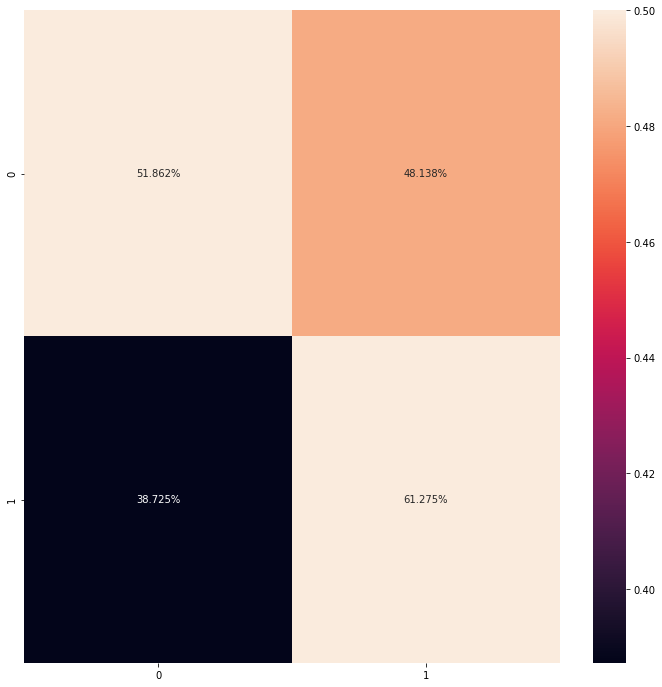

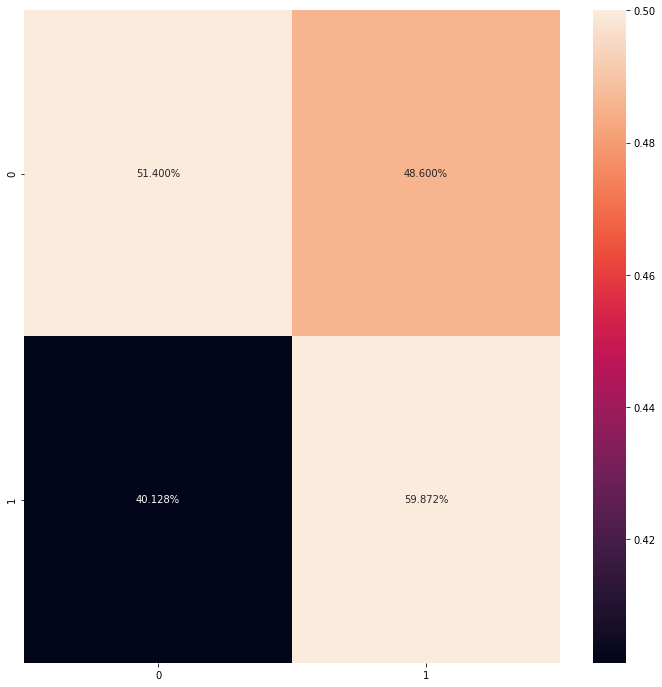

In [66]:
y_tr_pred_prob = lgbmc.predict_proba(X_train)
y_tr_pred = lgbmc.predict(X_train)
f1 = f1_score(y_train, y_tr_pred)
ll = log_loss(y_train, y_tr_pred_prob)
print(f'F1 score train: {f1}')
print(f'LogLoss score train: {ll}')

y_te_pred_prob = lgbmc.predict_proba(X_test)
y_te_pred = lgbmc.predict(X_test)
f1 = f1_score(y_test, y_te_pred)
ll = log_loss(y_test, y_te_pred_prob)
print(f'F1 score test: {f1}')
print(f'LogLoss score test: {ll}')

confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(2)))
confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(2)))

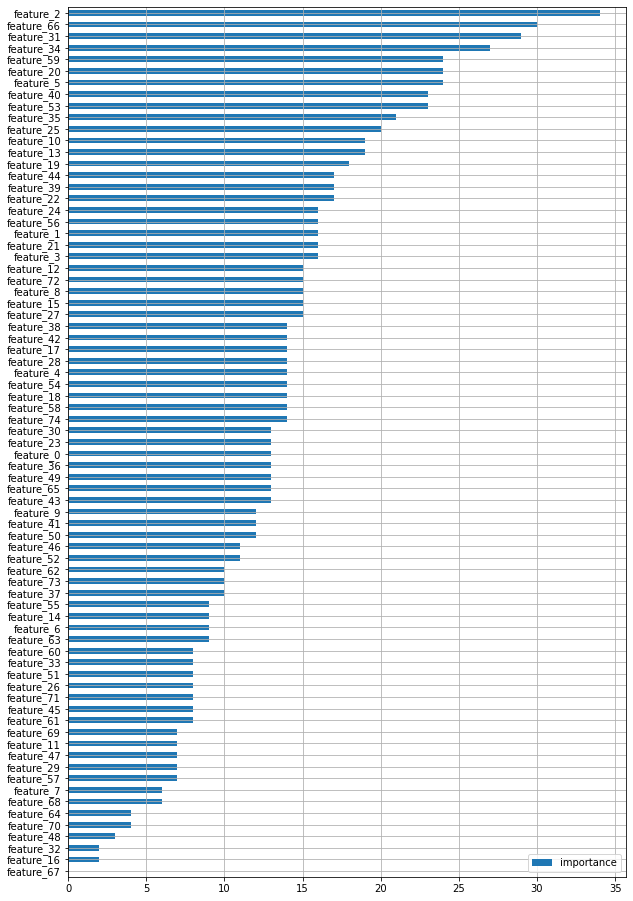

In [67]:
temp = pd.DataFrame(lgbmc.feature_importances_, 
             index=X_train.columns, 
             columns=['importance'])\
 .sort_values('importance', ascending=True)
temp.plot(kind='barh', figsize=(10,16))
plt.grid()
plt.show()

temp.index[::-1]

In [78]:
%%time
lr = LogisticRegressionCV(penalty='l2', class_weight='balanced')
lr.fit(X_train, y_train)

CPU times: user 1min, sys: 37.3 s, total: 1min 37s
Wall time: 8.72 s


F1 score train: 0.24548644065989142
LogLoss score train: 0.6831766984926886
F1 score test: 0.2373630597732078
LogLoss score test: 0.6842413657106782


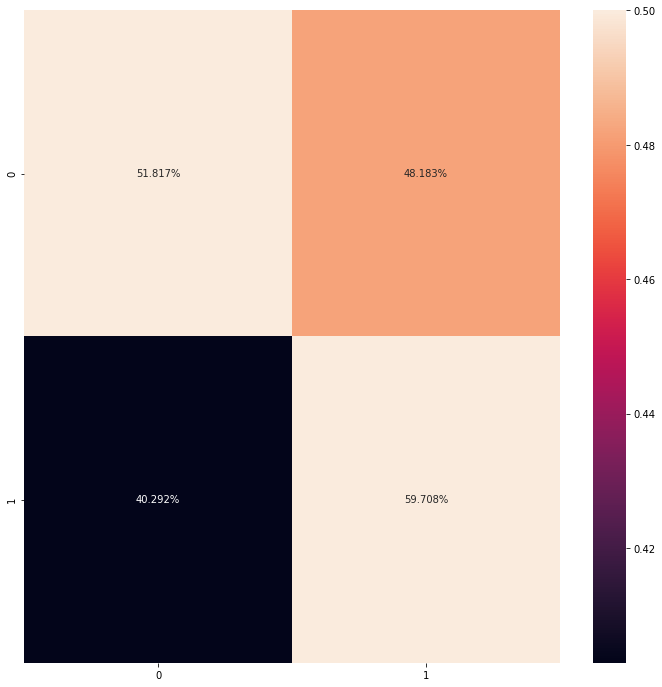

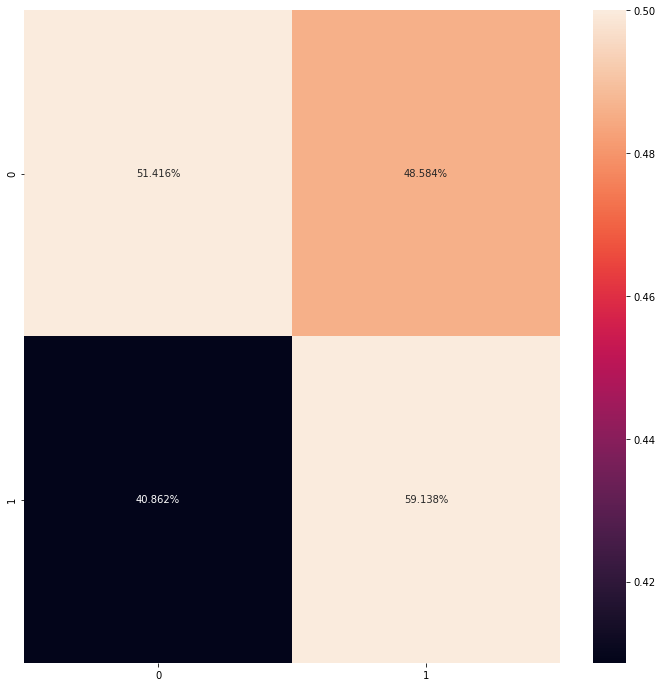

In [79]:
y_tr_pred_prob = lr.predict_proba(X_train)
y_tr_pred = lr.predict(X_train)
f1 = f1_score(y_train, y_tr_pred)
ll = log_loss(y_train, y_tr_pred_prob)
print(f'F1 score train: {f1}')
print(f'LogLoss score train: {ll}')

y_te_pred_prob = lr.predict_proba(X_test)
y_te_pred = lr.predict(X_test)
f1 = f1_score(y_test, y_te_pred)
ll = log_loss(y_test, y_te_pred_prob)
print(f'F1 score test: {f1}')
print(f'LogLoss score test: {ll}')

confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(2)))
confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(2)))

In [98]:
features

Index(['feature_0', 'feature_1', 'feature_2', 'feature_3', 'feature_4',
       'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9',
       'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14',
       'feature_15', 'feature_16', 'feature_17', 'feature_18', 'feature_19',
       'feature_20', 'feature_21', 'feature_22', 'feature_23', 'feature_24',
       'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_29',
       'feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34',
       'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39',
       'feature_40', 'feature_41', 'feature_42', 'feature_43', 'feature_44',
       'feature_45', 'feature_46', 'feature_47', 'feature_48', 'feature_49',
       'feature_50', 'feature_51', 'feature_52', 'feature_53', 'feature_54',
       'feature_55', 'feature_56', 'feature_57', 'feature_58', 'feature_59',
       'feature_60', 'feature_61', 'feature_62', 'feature_63', 'feature_64',
       'f

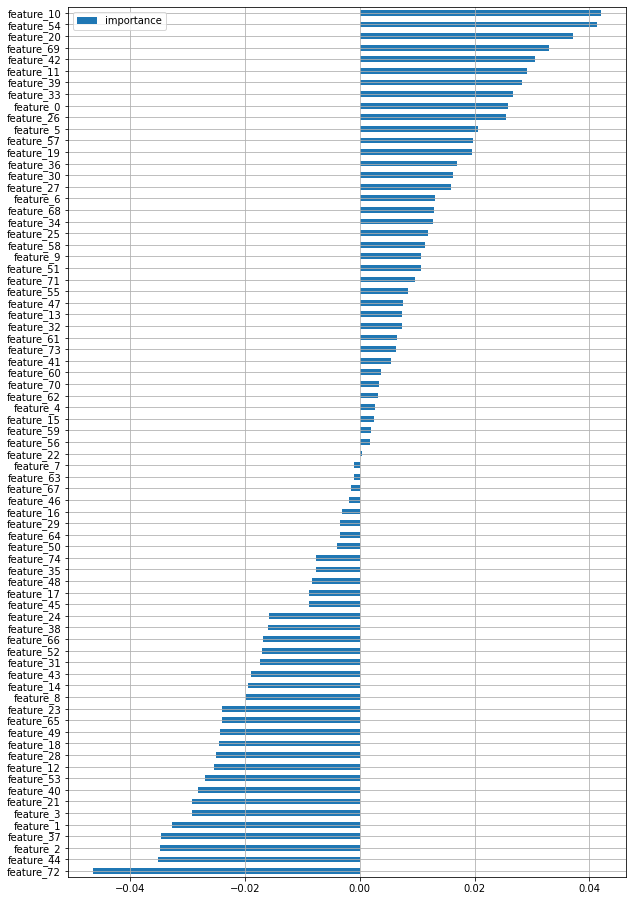

In [96]:
pd.DataFrame(lr.coef_, columns=features, index=['importance']).T.sort_values('importance', ascending=True).plot(kind='barh', figsize=(10,16))
plt.grid()
plt.show()

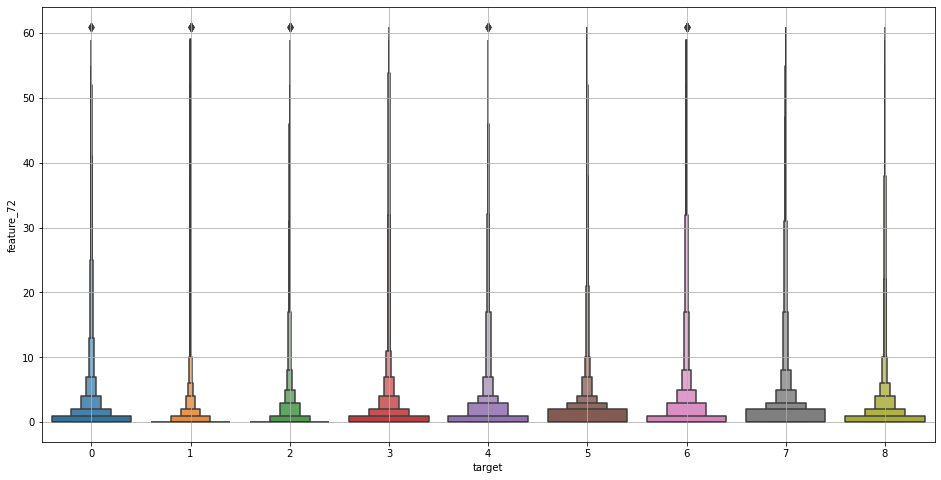

In [101]:
show_difference(train_data, 'feature_72', TARGET_NAME)

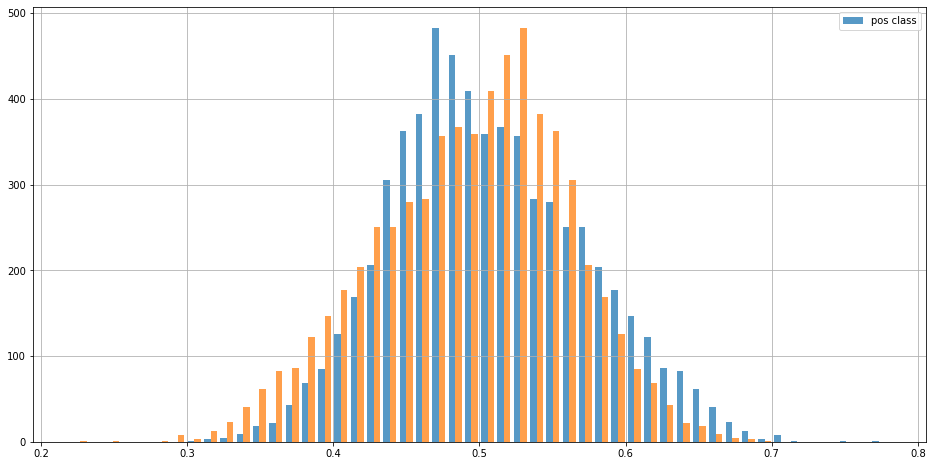

In [80]:
plt.figure(figsize=(16,8))
#plt.hist(y_tr_pred_prob[np.where(y_test == 0)], bins=50, alpha=0.75, label='neg class')
plt.hist(y_tr_pred_prob[np.where(y_test == 1)], bins=50, alpha=0.75, label='pos class')
plt.legend()
plt.grid()
plt.show()

AUC ROC: 0.5792405094336595
f1 score 0.24548644065989142


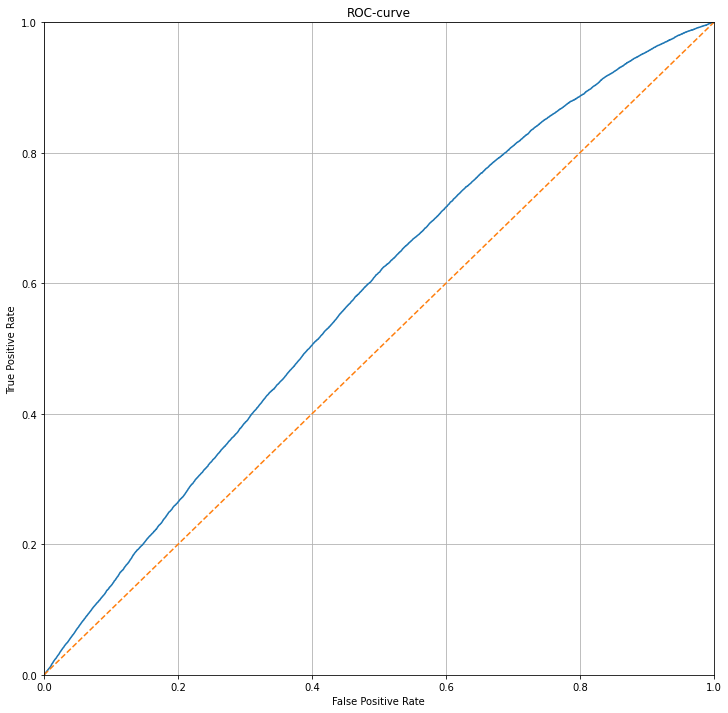

In [83]:
classification_scorer_roc_plot(lr, X_train, y_train)

AUC ROC: 0.5724773441876001
f1 score 0.2373630597732078


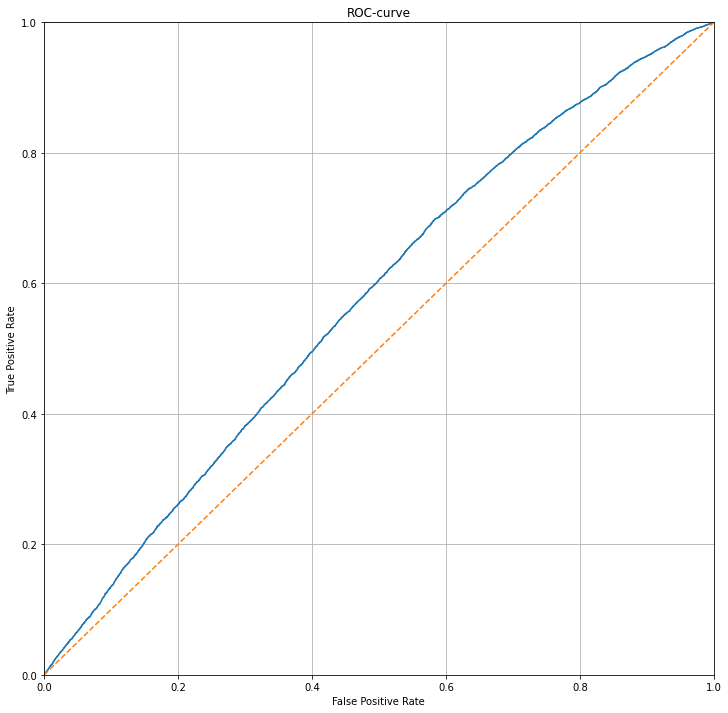

In [84]:
classification_scorer_roc_plot(lr, X_test, y_test)

## Balanced classes

In [76]:
# %%time
# lgbmc = LGBMClassifier(random_state=0, class_weight='balanced')
# lgbmc.fit(X_train, y_train)

CPU times: user 2min 37s, sys: 267 ms, total: 2min 37s
Wall time: 14.2 s


F1 score train: 0.3809281006426171
LogLoss score train: 1.92191263879834
F1 score test: 0.28807649710407457
LogLoss score test: 2.0170500307274954


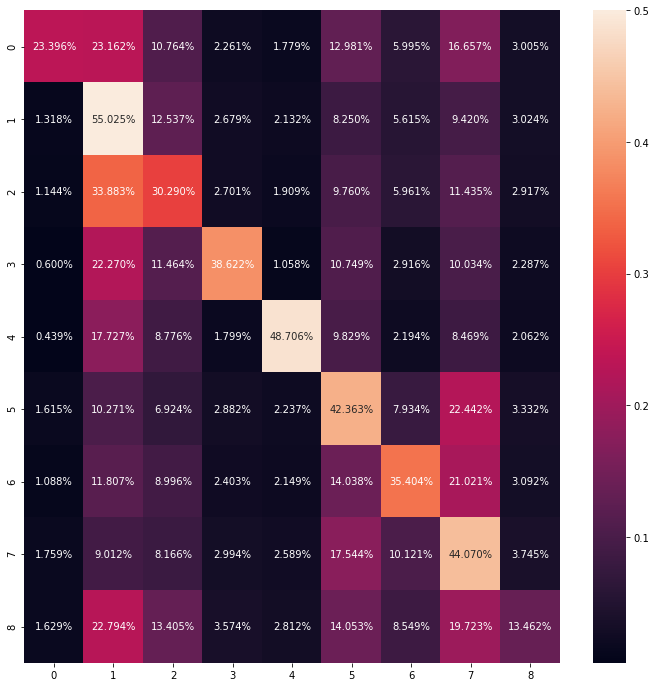

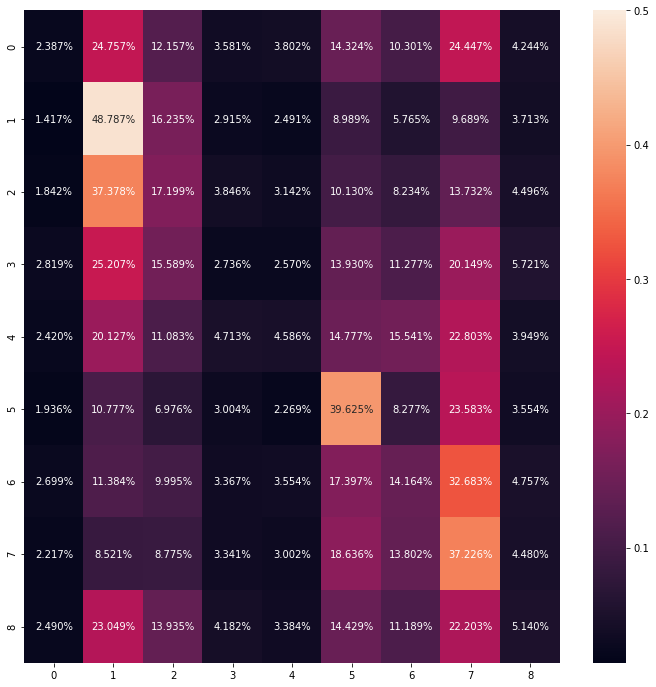

In [78]:
# y_tr_pred_prob = lgbmc.predict_proba(X_train)
# y_tr_pred = lgbmc.predict(X_train)
# f1 = f1_score(y_train, y_tr_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_train).values, y_tr_pred_prob)
# print(f'F1 score train: {f1}')
# print(f'LogLoss score train: {ll}')

# y_te_pred_prob = lgbmc.predict_proba(X_test)
# y_te_pred = lgbmc.predict(X_test)
# f1 = f1_score(y_test, y_te_pred, average='weighted')
# ll = log_loss(pd.get_dummies(y_test).values, y_te_pred_prob)
# print(f'F1 score test: {f1}')
# print(f'LogLoss score test: {ll}')

# confusion_matrix_plot(y_train, y_tr_pred, class_names=list(range(9)))
# confusion_matrix_plot(y_test, y_te_pred, class_names=list(range(9)))

## Errors analysis

In [240]:
errors = y_train.to_frame()
errors['pred_lgbm'] = y_tr_pred
errors['error'] = (errors['pred_lgbm'] != errors['target']).astype(int)

# indexes where clf make error
errors_index = errors[errors['error'] == 1].index
# indexes where clf is right
right_index = errors[errors['error'] == 0].index
# indexes where clf is right and it is not a trevial classes
wrong_classes_index = errors[(errors['error'] == 0) & (~errors['target'].isin([1, 5, 7]))].index

train_errors = pd.concat([X_train, errors], axis=1) 

# errors.loc[errors_index].groupby(['target', 'pred_lgbm'], as_index=False).count()

In [241]:
errors = y_test.to_frame()
errors['pred_lgbm'] = y_te_pred
errors['error'] = (errors['pred_lgbm'] != errors['target']).astype(int)

# indexes where clf make error
errors_index = errors[errors['error'] == 1].index
# indexes where clf is right
right_index = errors[errors['error'] == 0].index
# indexes where clf is right and it is not a trevial classes
wrong_classes_index = errors[(errors['error'] == 0) & (~errors['target'].isin([1, 5, 7]))].index

test_errors = pd.concat([X_test, errors], axis=1) 

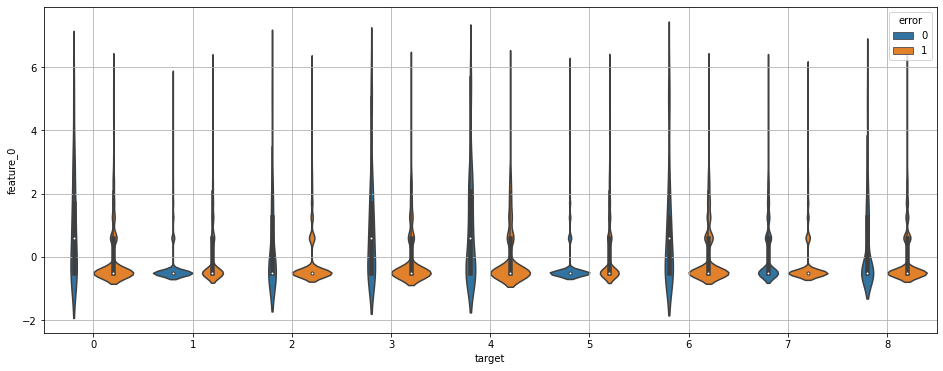

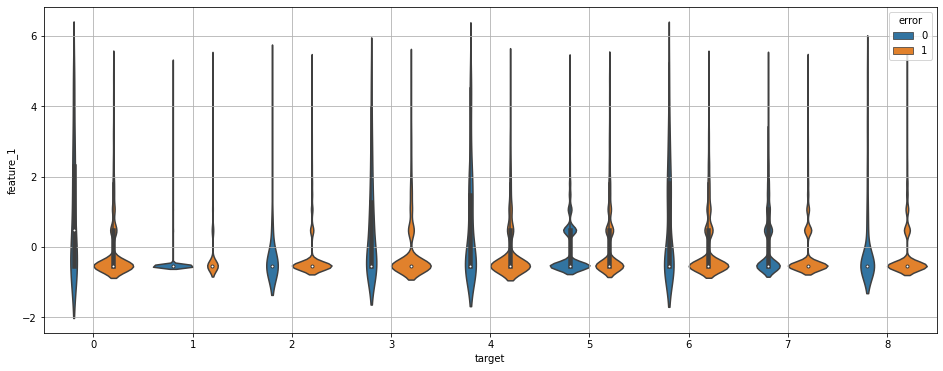

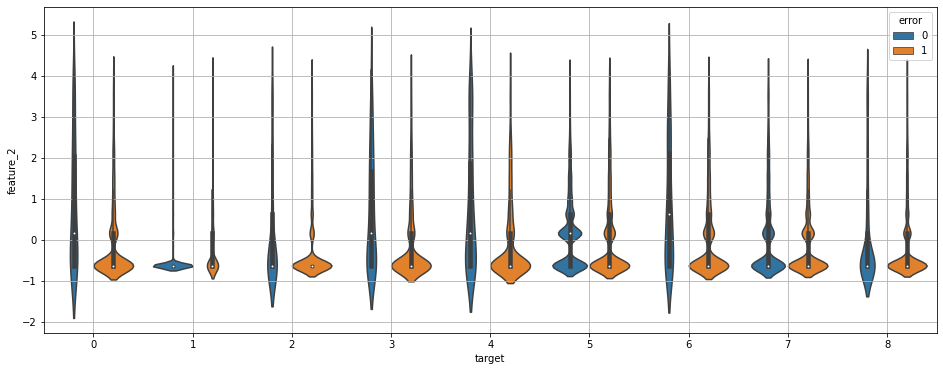

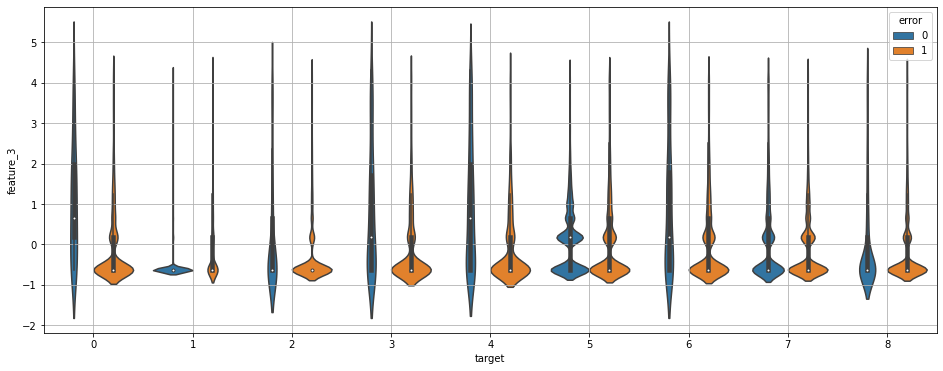

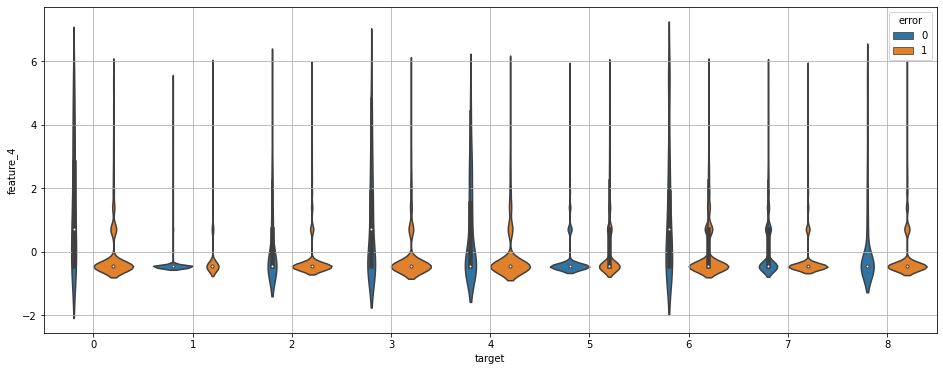

...

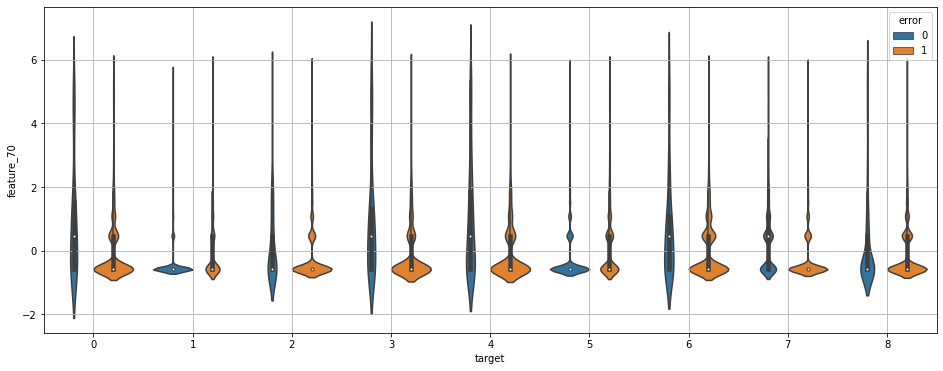

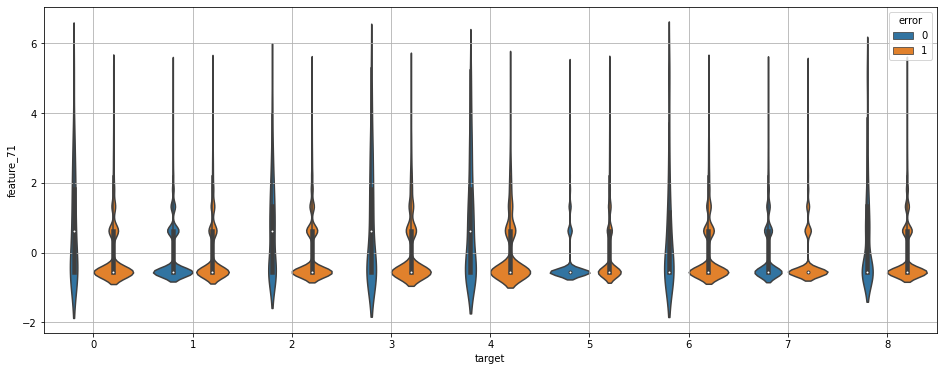

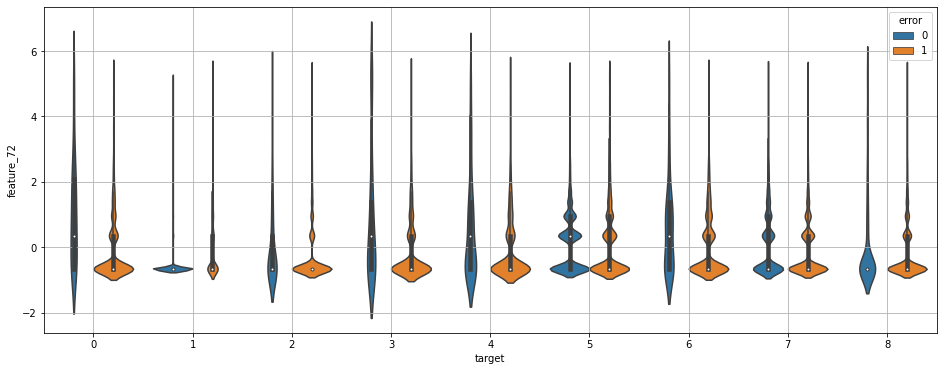

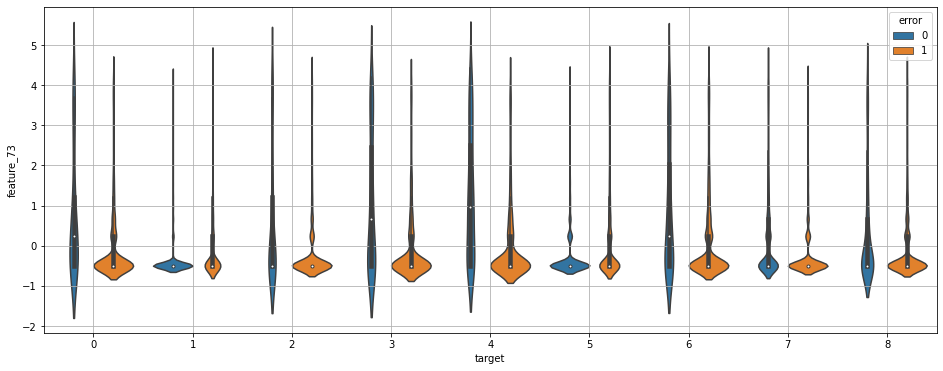

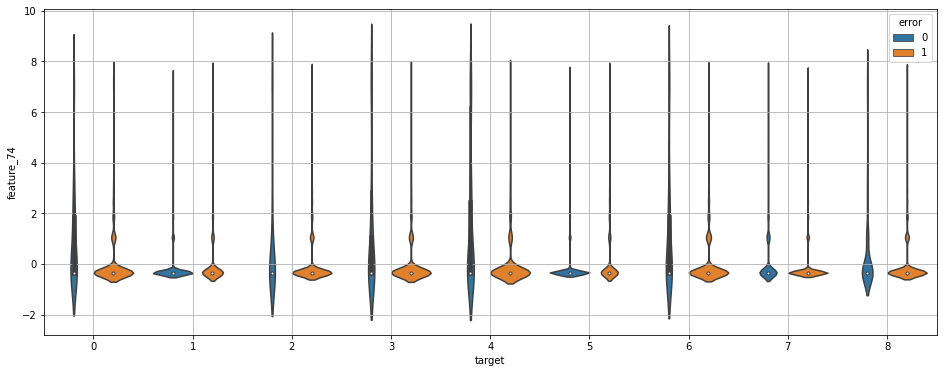

In [242]:
for f in features:
    plt.figure(figsize=(16,6))
    sns.violinplot(x=TARGET_NAME, y=f, hue='error', data=train_errors)
    plt.grid()
    plt.show()

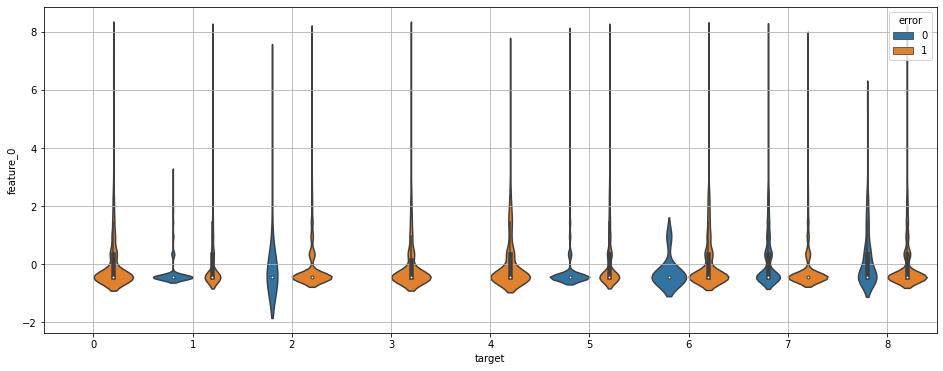

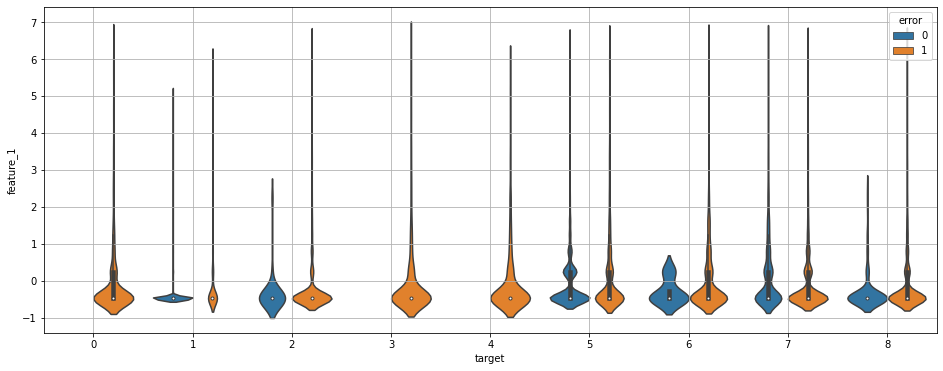

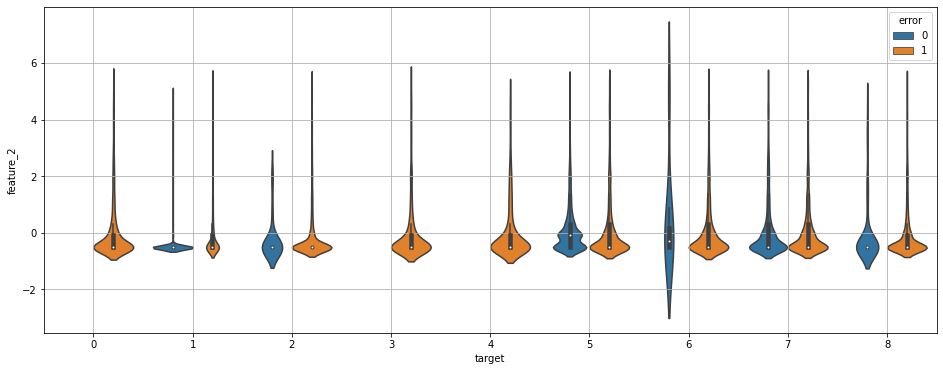

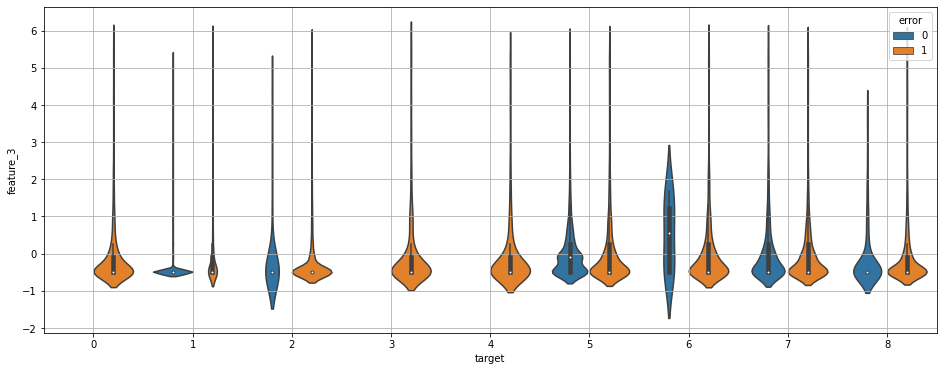

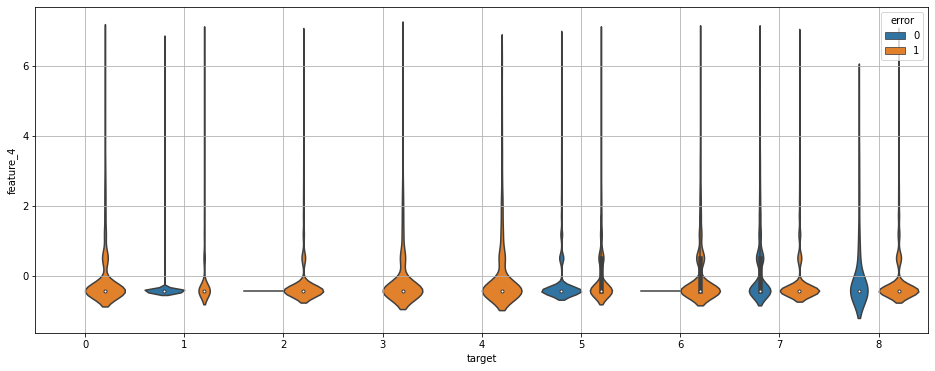

...

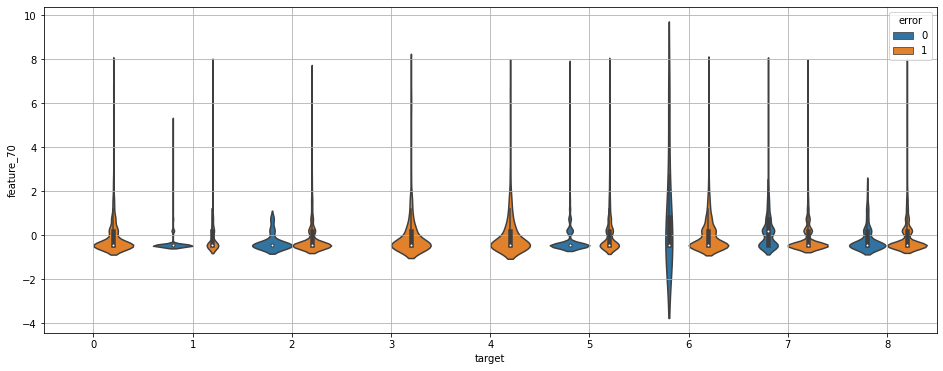

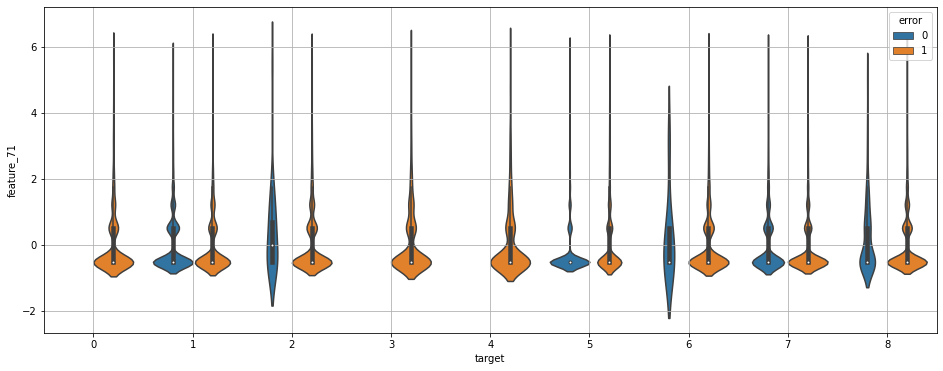

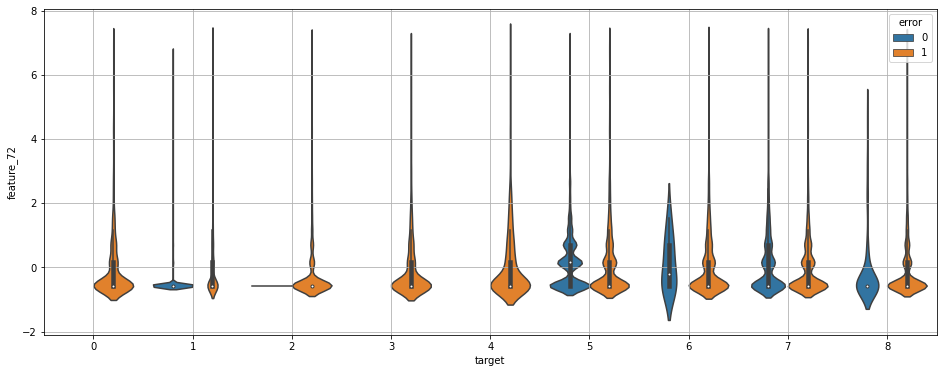

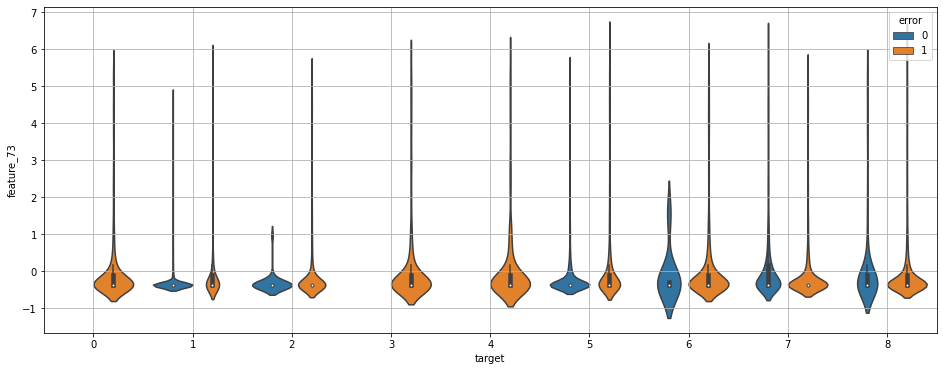

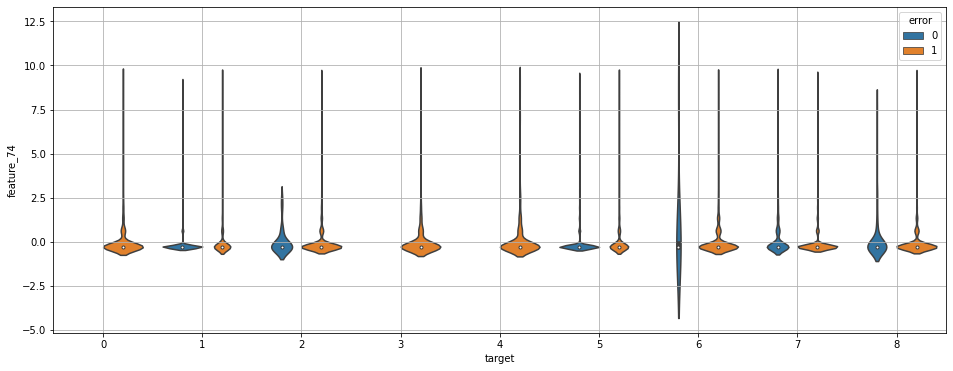

In [139]:
for f in features:
    plt.figure(figsize=(16,6))
    sns.violinplot(x=TARGET_NAME, y=f, hue='error', data=test_errors)
    plt.grid()
    plt.show()

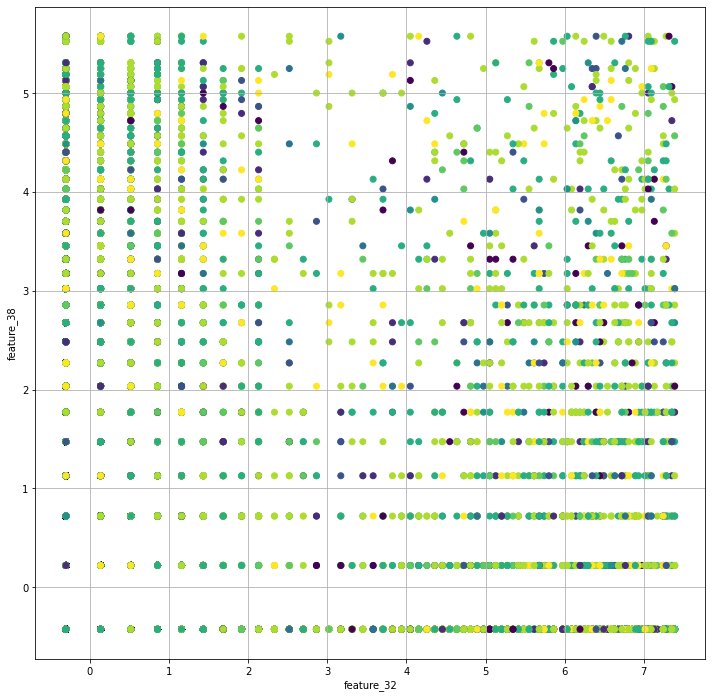

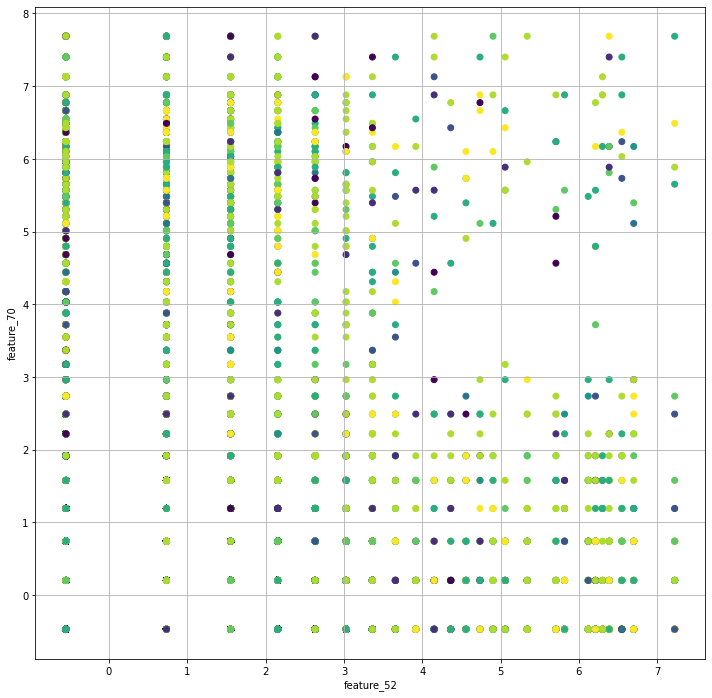

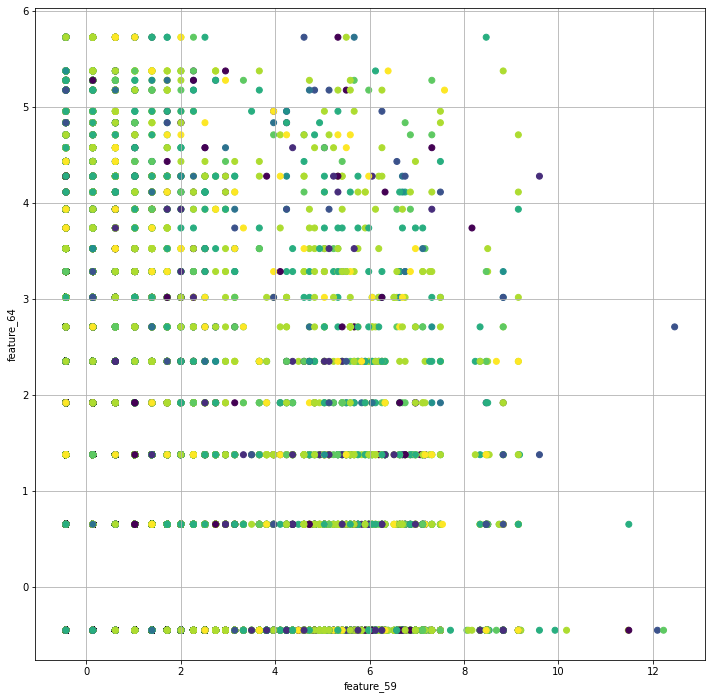

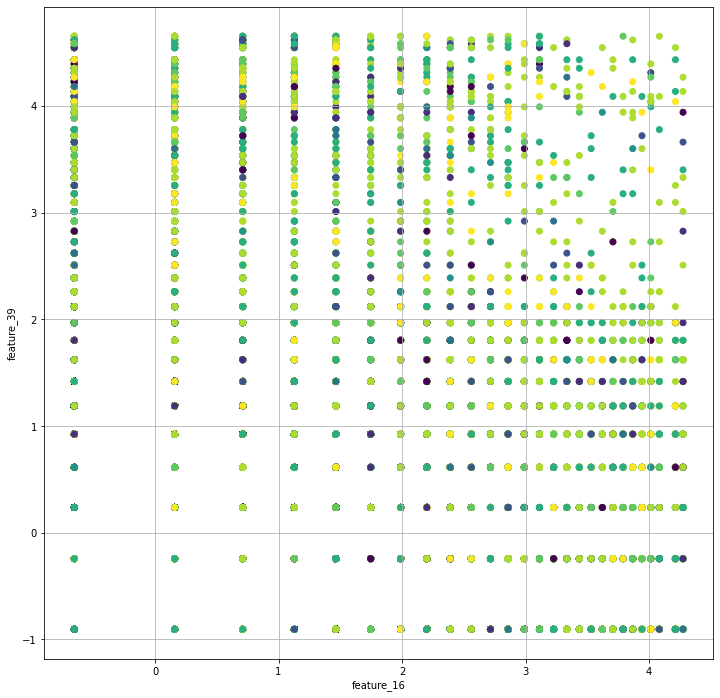

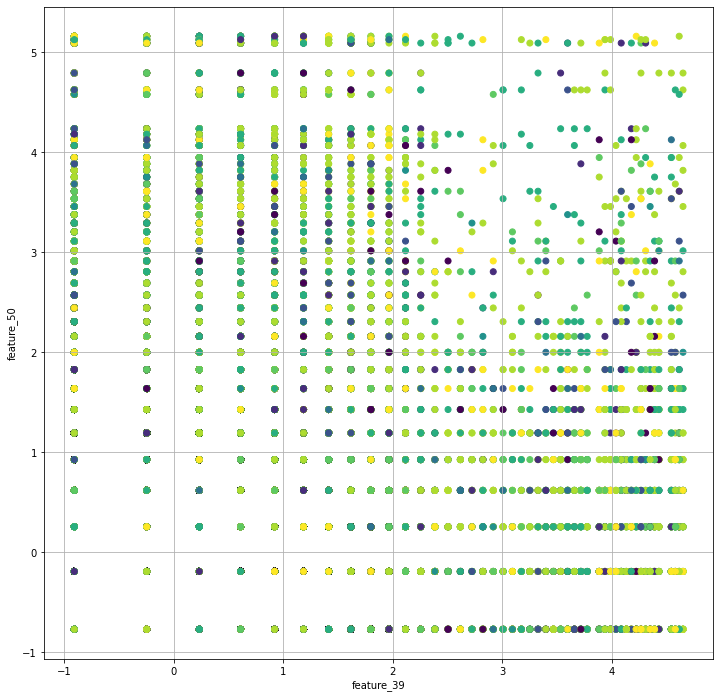

In [152]:
for i in np.random.randint(0, len(pair_feat), size=5):
    p = pair_feat[i]
    plt.figure(figsize=(12,12))
    plt.scatter(X_train[p[0]], X_train[p[1]], c=y_train)
    plt.grid()
    plt.xlabel(p[0])
    plt.ylabel(p[1])
    plt.show()

## Make submission

In [74]:
X_sub = test_data.drop(columns='id')
X_sub = pd.DataFrame(scaler.transform(np.log1p(test_data.drop(columns=['id']))), columns=X_sub.columns)
X_sub[bins_col] = kbins.transform(X_sub)

In [19]:
#X_sub[['pca_feature_1', 'pca_feature_2']] = pca_2.transform(X_sub)

# pca_70_sub = pd.DataFrame(pca_70.transform(\
#                            scaler.transform(test_data[features])), 
#                          columns=pca_cols)

In [20]:
# %%time
# y_sub_pred = svm.predict_proba(X_sub)
# submission.iloc[:, 1:] = y_sub_pred
# submission.to_csv('../../../data/kaggle/TPS_JUNE2021/svm_baseline.csv', index = False)


# %%time
# y_sub_pred = rfc.predict_proba(X_sub)
# submission.iloc[:, 1:] = y_sub_pred
# submission.to_csv('../../../data/kaggle/TPS_JUNE2021/rfc_baseline.csv', index = False)

# %%time
# y_sub_pred = lgbmc_nb.predict_proba(pca_70_sub)
# submission.iloc[:, 1:] = y_sub_pred
# submission.to_csv('../../../data/kaggle/TPS_JUNE2021/pca_70.csv', index = False)

CPU times: user 30.6 s, sys: 88 ms, total: 30.7 s
Wall time: 4.52 s


In [75]:
%%time
y_sub_pred = lgbmc_nb.predict_proba(X_sub)
submission.iloc[:, 1:] = y_sub_pred
submission.to_csv('../../../data/kaggle/TPS_JUNE2021/kbins+_lgbm.csv', index = False)

CPU times: user 2min 14s, sys: 165 ms, total: 2min 14s
Wall time: 13.6 s


In [ ]:
# plt.figure(figsize=(8,4))
# plt.hist(y_pred[np.where(y_test == 0)], bins=100, alpha=0.75, label='neg class')
# plt.hist(y_pred[np.where(y_test == 1)], bins=100, alpha=0.75, label='pos class')
# plt.legend()
# plt.show()